In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)

#Since the NaN values of GHI are gone which is used in data preparation, simulate these in solar activity instead
df['solar_activity'].loc[df['Year'] > 2020] = np.nan
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['GHI'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df) 

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       10

C:\Users\User\AppData\Local\Temp\ipykernel_43840\378485490.py:383: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['solar_activity'].loc[df['Year'] > 2020] = np.nan


Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
(84, 1, 1, 1975)
(11, 1, 1, 1975)
(10, 1, 1, 1975)
(84, 1, 1975)
(11, 1, 1975)
(10, 1, 1975)
(84, 1975)
(11, 1975)
(10, 1975)
[[0.42725031 0.69695044 0.32924264 ... 0.57644883 0.72133169 0.78483354]
 [0.45745993 0.51683609 0.42215989 ... 0.54808878 0.5838471  0.76633785]
 [0.43218249 0.62674714 0.3411641  ... 0.52589396 0.66646116 0.78853268]
 ...
 [0.47102343 0.46473952 0.46949509 ... 0.56535142 0.57583231 0.59494451]
 [0.43464858 0.51620076 0.3997195  ... 0.49815043 0.6405672  0.8027127 ]
 [0.44389642 0.52414231 0.42356241 ... 0.55733662 0.61837238 0.68064118]]
Fold 2:
(84, 1, 1, 1975)
(11, 1, 1, 1975)
(10, 1, 1, 1975)
(84, 1, 1975)
(11, 1, 1975)
(10, 1, 1975)
(84, 1975)
(11, 1975)
(10, 1975)
[[0.43464858 0.62313675 0.34639831 ... 0.52589396 0.69605425 0.79839704]
 [0.42725031 0.71548931 0.32450565 ... 0.57644883 0.72133169 0.78483354]
 [0.45745993 0.53175632 0.4180791  ... 0.54808878 0.5838471  0.76633785]
 ...
 [0.47102343 0.47861309 0.465

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 1975)
(11, 1975)


In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit a CNN-LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100

# Optimize and fit the model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S12_No_GHI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

[I 2025-05-27 02:21:55,322] A new study created in memory with name: no-name-4bfb89e5-0a16-4807-ada4-1fa2968d63c9
[I 2025-05-27 02:29:22,565] Trial 0 finished with value: 3.210889196395874 and parameters: {'lr': 0.8915700241469239, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3751512259559072}. Best is trial 0 with value: 3.210889196395874.


Cross Validation Accuracies:
[3.3662092685699463, 6.95597505569458, 1.359480857849121, 2.0468556880950928, 2.32592511177063]
Mean Cross Validation Accuracy:
3.210889196395874
Standard Deviation of Cross Validation Accuracy:
1.980688804123624


[I 2025-05-27 02:33:29,198] Trial 1 finished with value: 0.35568120926618574 and parameters: {'lr': 0.05338464543256939, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.124856610593789}. Best is trial 1 with value: 0.35568120926618574.


Cross Validation Accuracies:
[0.3935386538505554, 0.37822726368904114, 0.10384523123502731, 0.6055102944374084, 0.2972846031188965]
Mean Cross Validation Accuracy:
0.35568120926618574
Standard Deviation of Cross Validation Accuracy:
0.16198000241907565


[I 2025-05-27 02:38:46,563] Trial 2 finished with value: 0.05731524974107742 and parameters: {'lr': 0.1074218238790529, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.48672557799324845}. Best is trial 2 with value: 0.05731524974107742.


Cross Validation Accuracies:
[0.0487692691385746, 0.05355300009250641, 0.06406901031732559, 0.0614948645234108, 0.05869010463356972]
Mean Cross Validation Accuracy:
0.05731524974107742
Standard Deviation of Cross Validation Accuracy:
0.0055165386702518615


[I 2025-05-27 02:43:10,971] Trial 3 finished with value: 0.057065348327159884 and parameters: {'lr': 0.017490289266950825, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3225023396595699}. Best is trial 3 with value: 0.057065348327159884.


Cross Validation Accuracies:
[0.05239013209939003, 0.05178495869040489, 0.06517085433006287, 0.06488818675279617, 0.05109260976314545]
Mean Cross Validation Accuracy:
0.057065348327159884
Standard Deviation of Cross Validation Accuracy:
0.006516284156528555


[I 2025-05-27 02:48:33,648] Trial 4 finished with value: 0.05304358974099159 and parameters: {'lr': 0.03868543805568852, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1070635706706402}. Best is trial 4 with value: 0.05304358974099159.


Cross Validation Accuracies:
[0.034945905208587646, 0.05627529323101044, 0.06262177228927612, 0.05723172798752785, 0.05414324998855591]
Mean Cross Validation Accuracy:
0.05304358974099159
Standard Deviation of Cross Validation Accuracy:
0.009470601126034697


[I 2025-05-27 02:53:15,528] Trial 5 finished with value: 0.2857457369565964 and parameters: {'lr': 0.002587993234734677, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.48627432406811155}. Best is trial 4 with value: 0.05304358974099159.


Cross Validation Accuracies:
[0.27769532799720764, 0.2833769619464874, 0.3065360486507416, 0.23811040818691254, 0.3230099380016327]
Mean Cross Validation Accuracy:
0.2857457369565964
Standard Deviation of Cross Validation Accuracy:
0.02884580547089087


[I 2025-05-27 03:00:02,205] Trial 6 finished with value: 0.07149069607257844 and parameters: {'lr': 0.0034959972454548863, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11745403881043077}. Best is trial 4 with value: 0.05304358974099159.


Cross Validation Accuracies:
[0.054979607462882996, 0.07553736120462418, 0.07220994681119919, 0.07647118717432022, 0.07825537770986557]
Mean Cross Validation Accuracy:
0.07149069607257844
Standard Deviation of Cross Validation Accuracy:
0.00848616611505472


[I 2025-05-27 03:07:01,650] Trial 7 finished with value: 0.065762909501791 and parameters: {'lr': 0.6735928526909591, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.3828802606350137}. Best is trial 4 with value: 0.05304358974099159.


Cross Validation Accuracies:
[0.06744593381881714, 0.05053120478987694, 0.06969291716814041, 0.061301231384277344, 0.07984326034784317]
Mean Cross Validation Accuracy:
0.065762909501791
Standard Deviation of Cross Validation Accuracy:
0.009679310007561838


[I 2025-05-27 03:12:35,836] Trial 8 finished with value: 0.05361337885260582 and parameters: {'lr': 0.2155050905876336, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2638417643480383}. Best is trial 4 with value: 0.05304358974099159.


Cross Validation Accuracies:
[0.03963271528482437, 0.04438002035021782, 0.06386955827474594, 0.06967909634113312, 0.05050550401210785]
Mean Cross Validation Accuracy:
0.05361337885260582
Standard Deviation of Cross Validation Accuracy:
0.01143389035992225


[I 2025-05-27 03:18:16,625] Trial 9 finished with value: 0.40000289082527163 and parameters: {'lr': 0.0014247807703229828, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.36201046336024134}. Best is trial 4 with value: 0.05304358974099159.


Cross Validation Accuracies:
[0.3533465564250946, 0.4381830394268036, 0.3942660987377167, 0.42403343319892883, 0.39018532633781433]
Mean Cross Validation Accuracy:
0.40000289082527163
Standard Deviation of Cross Validation Accuracy:
0.029466250557509194


[I 2025-05-27 03:24:44,638] Trial 10 finished with value: 1.030321717262268 and parameters: {'lr': 0.014901053587820531, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2055151569683376}. Best is trial 4 with value: 0.05304358974099159.


Cross Validation Accuracies:
[0.8980801105499268, 1.0548673868179321, 0.9542996883392334, 1.1341978311538696, 1.1101635694503784]
Mean Cross Validation Accuracy:
1.030321717262268
Standard Deviation of Cross Validation Accuracy:
0.09059210751430961


[I 2025-05-27 03:29:00,248] Trial 11 finished with value: 0.0746979296207428 and parameters: {'lr': 0.20324807278636697, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2381875887554671}. Best is trial 4 with value: 0.05304358974099159.


Cross Validation Accuracies:
[0.06304740160703659, 0.07273981720209122, 0.07982823252677917, 0.07536571472883224, 0.08250848203897476]
Mean Cross Validation Accuracy:
0.0746979296207428
Standard Deviation of Cross Validation Accuracy:
0.006742991638411709


[I 2025-05-27 03:34:08,331] Trial 12 finished with value: 0.06646361649036407 and parameters: {'lr': 0.2468008676058578, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.20759678619162447}. Best is trial 4 with value: 0.05304358974099159.


Cross Validation Accuracies:
[0.042159803211688995, 0.05942048132419586, 0.07109329849481583, 0.0779932513833046, 0.0816512480378151]
Mean Cross Validation Accuracy:
0.06646361649036407
Standard Deviation of Cross Validation Accuracy:
0.01431999777305572


[I 2025-05-27 03:40:48,015] Trial 13 finished with value: 0.0532377265393734 and parameters: {'lr': 0.009094922481844781, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.26120335252520943}. Best is trial 4 with value: 0.05304358974099159.


Cross Validation Accuracies:
[0.04040956869721413, 0.05165983736515045, 0.06257463246583939, 0.06276856362819672, 0.04877603054046631]
Mean Cross Validation Accuracy:
0.0532377265393734
Standard Deviation of Cross Validation Accuracy:
0.008543685000624867


[I 2025-05-27 03:47:07,240] Trial 14 finished with value: 0.05283383578062058 and parameters: {'lr': 0.006916637902323985, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.15420686623388266}. Best is trial 14 with value: 0.05283383578062058.


Cross Validation Accuracies:
[0.0417027622461319, 0.05094313994050026, 0.062260325998067856, 0.06048448011279106, 0.0487784706056118]
Mean Cross Validation Accuracy:
0.05283383578062058
Standard Deviation of Cross Validation Accuracy:
0.00763298882495865


[I 2025-05-27 03:54:36,817] Trial 15 finished with value: 4.351021814346313 and parameters: {'lr': 0.04008992670738192, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.161493418614046}. Best is trial 14 with value: 0.05283383578062058.


Cross Validation Accuracies:
[4.709427356719971, 4.751791477203369, 4.193157196044922, 4.418369293212891, 3.682363748550415]
Mean Cross Validation Accuracy:
4.351021814346313
Standard Deviation of Cross Validation Accuracy:
0.39131352776150063


[I 2025-05-27 04:00:01,584] Trial 16 finished with value: 0.05271901786327362 and parameters: {'lr': 0.0069330792773055015, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.10229869019035129}. Best is trial 16 with value: 0.05271901786327362.


Cross Validation Accuracies:
[0.04097284376621246, 0.05075870454311371, 0.06152808293700218, 0.062259480357170105, 0.048075977712869644]
Mean Cross Validation Accuracy:
0.05271901786327362
Standard Deviation of Cross Validation Accuracy:
0.008148537391956426


[I 2025-05-27 04:06:29,338] Trial 17 finished with value: 0.05197881236672401 and parameters: {'lr': 0.006184665346124132, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.1657756978798209}. Best is trial 17 with value: 0.05197881236672401.


Cross Validation Accuracies:
[0.039803776890039444, 0.0501040443778038, 0.061929985880851746, 0.060655128210783005, 0.047401126474142075]
Mean Cross Validation Accuracy:
0.05197881236672401
Standard Deviation of Cross Validation Accuracy:
0.00833073541694967


[I 2025-05-27 04:13:28,107] Trial 18 finished with value: 0.03789966553449631 and parameters: {'lr': 0.0011826750983492296, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.1648911878866855}. Best is trial 18 with value: 0.03789966553449631.


Cross Validation Accuracies:
[0.03685816004872322, 0.033433448523283005, 0.044863663613796234, 0.029246382415294647, 0.04509667307138443]
Mean Cross Validation Accuracy:
0.03789966553449631
Standard Deviation of Cross Validation Accuracy:
0.006264268888605029


[I 2025-05-27 04:19:20,240] Trial 19 finished with value: 0.035131065919995305 and parameters: {'lr': 0.001385430461531299, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.18148424251799894}. Best is trial 19 with value: 0.035131065919995305.


Cross Validation Accuracies:
[0.026638245210051537, 0.03480645641684532, 0.04380621761083603, 0.036088019609451294, 0.03431639075279236]
Mean Cross Validation Accuracy:
0.035131065919995305
Standard Deviation of Cross Validation Accuracy:
0.005460239697883277


[I 2025-05-27 04:23:35,251] Trial 20 finished with value: 0.03585897088050842 and parameters: {'lr': 0.0015488861073380193, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.19992526926453819}. Best is trial 19 with value: 0.035131065919995305.


Cross Validation Accuracies:
[0.028685517609119415, 0.036482956260442734, 0.04897027090191841, 0.037646740674972534, 0.02750936895608902]
Mean Cross Validation Accuracy:
0.03585897088050842
Standard Deviation of Cross Validation Accuracy:
0.007702804047577291


[I 2025-05-27 04:28:31,683] Trial 21 finished with value: 0.03380638733506203 and parameters: {'lr': 0.001022101778182411, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2011270795275873}. Best is trial 21 with value: 0.03380638733506203.


Cross Validation Accuracies:
[0.03744408115744591, 0.033086035400629044, 0.040528133511543274, 0.027118148282170296, 0.030855538323521614]
Mean Cross Validation Accuracy:
0.03380638733506203
Standard Deviation of Cross Validation Accuracy:
0.004740751974812152


[I 2025-05-27 04:33:07,828] Trial 22 finished with value: 0.05105890706181526 and parameters: {'lr': 0.002152563601272511, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.21482076153943672}. Best is trial 21 with value: 0.03380638733506203.


Cross Validation Accuracies:
[0.032967355102300644, 0.047235433012247086, 0.06389014422893524, 0.05899433791637421, 0.05220726504921913]
Mean Cross Validation Accuracy:
0.05105890706181526
Standard Deviation of Cross Validation Accuracy:
0.010685070353209099


[I 2025-05-27 04:37:15,646] Trial 23 finished with value: 0.03991535902023315 and parameters: {'lr': 0.001395750632469423, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3008416383841851}. Best is trial 21 with value: 0.03380638733506203.


Cross Validation Accuracies:
[0.03233494609594345, 0.047306790947914124, 0.04491710662841797, 0.036476317793130875, 0.038541633635759354]
Mean Cross Validation Accuracy:
0.03991535902023315
Standard Deviation of Cross Validation Accuracy:
0.005492313377328707


[I 2025-05-27 04:41:37,862] Trial 24 finished with value: 0.03142930753529072 and parameters: {'lr': 0.0010594923722332965, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.19321053519116554}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.024258654564619064, 0.032862912863492966, 0.03882450610399246, 0.028499869629740715, 0.03270059451460838]
Mean Cross Validation Accuracy:
0.03142930753529072
Standard Deviation of Cross Validation Accuracy:
0.004865392628753331


[I 2025-05-27 04:46:45,766] Trial 25 finished with value: 0.05964296087622643 and parameters: {'lr': 0.0034082107013408028, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2591333705468927}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.04838228598237038, 0.05196637287735939, 0.07301488518714905, 0.06957831233739853, 0.05527294799685478]
Mean Cross Validation Accuracy:
0.05964296087622643
Standard Deviation of Cross Validation Accuracy:
0.009821907995592316


[I 2025-05-27 04:52:37,778] Trial 26 finished with value: 0.05539325028657913 and parameters: {'lr': 0.004087252762346583, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.19020318123377764}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.042313285171985626, 0.054525140672922134, 0.06455646455287933, 0.06340102851390839, 0.05217033252120018]
Mean Cross Validation Accuracy:
0.05539325028657913
Standard Deviation of Cross Validation Accuracy:
0.008127918656715484


[I 2025-05-27 04:57:08,701] Trial 27 finished with value: 0.035814936831593515 and parameters: {'lr': 0.0010437944800955879, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2338030949708122}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.03489832952618599, 0.03369608521461487, 0.045080188661813736, 0.02931043691933155, 0.03608964383602142]
Mean Cross Validation Accuracy:
0.035814936831593515
Standard Deviation of Cross Validation Accuracy:
0.005168337753115527


[I 2025-05-27 05:02:04,643] Trial 28 finished with value: 0.04292573817074299 and parameters: {'lr': 0.0021638534087570728, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1448076480772054}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.030947363004088402, 0.05244465172290802, 0.05172547325491905, 0.029430817812681198, 0.05008038505911827]
Mean Cross Validation Accuracy:
0.04292573817074299
Standard Deviation of Cross Validation Accuracy:
0.010438662481047715


[I 2025-05-27 05:06:19,295] Trial 29 finished with value: 0.05466122329235077 and parameters: {'lr': 0.001056534248188076, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2996945749255017}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.03980864956974983, 0.05031916871666908, 0.06518737971782684, 0.06006116792559624, 0.05792975053191185]
Mean Cross Validation Accuracy:
0.05466122329235077
Standard Deviation of Cross Validation Accuracy:
0.008832836753557203


[I 2025-05-27 05:10:51,623] Trial 30 finished with value: 0.1102487787604332 and parameters: {'lr': 0.013843603537031915, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1798815546874052}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.09956839680671692, 0.10601305216550827, 0.11729555577039719, 0.10026346892118454, 0.12810342013835907]
Mean Cross Validation Accuracy:
0.1102487787604332
Standard Deviation of Cross Validation Accuracy:
0.01095594483385635


[I 2025-05-27 05:15:20,571] Trial 31 finished with value: 0.04870100915431976 and parameters: {'lr': 0.0019830913364327876, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.23059957085578145}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.03360535949468613, 0.04711775481700897, 0.057739898562431335, 0.05833500996232033, 0.046707022935152054]
Mean Cross Validation Accuracy:
0.04870100915431976
Standard Deviation of Cross Validation Accuracy:
0.009042973043041413


[I 2025-05-27 05:19:39,056] Trial 32 finished with value: 0.03618316613137722 and parameters: {'lr': 0.0010031669818953996, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.23099364403641878}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.04376348480582237, 0.03127243369817734, 0.04551078379154205, 0.03234102204442024, 0.028028106316924095]
Mean Cross Validation Accuracy:
0.03618316613137722
Standard Deviation of Cross Validation Accuracy:
0.007068918548308344


[I 2025-05-27 05:24:04,613] Trial 33 finished with value: 0.056648869067430496 and parameters: {'lr': 0.004210879394286346, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.13422859420432393}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.049446847289800644, 0.05279175192117691, 0.06406629085540771, 0.06337590515613556, 0.05356355011463165]
Mean Cross Validation Accuracy:
0.056648869067430496
Standard Deviation of Cross Validation Accuracy:
0.00594200006606155


[I 2025-05-27 05:28:27,196] Trial 34 finished with value: 0.055238648504018786 and parameters: {'lr': 0.002507065075485188, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2871405704121996}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.040925540030002594, 0.05699783191084862, 0.06379564851522446, 0.06566648185253143, 0.048807740211486816]
Mean Cross Validation Accuracy:
0.055238648504018786
Standard Deviation of Cross Validation Accuracy:
0.00928739295443993


[I 2025-05-27 05:32:54,455] Trial 35 finished with value: 0.05327631086111069 and parameters: {'lr': 0.0016976856152033331, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.18359448497141823}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.042286552488803864, 0.04581654444336891, 0.06552702188491821, 0.06270615011453629, 0.05004528537392616]
Mean Cross Validation Accuracy:
0.05327631086111069
Standard Deviation of Cross Validation Accuracy:
0.00922891346499768


[I 2025-05-27 05:38:04,654] Trial 36 finished with value: 0.1660659432411194 and parameters: {'lr': 0.023261144559603215, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.24383586003324798}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.1639118790626526, 0.2079237401485443, 0.1412414014339447, 0.15205122530460358, 0.16520147025585175]
Mean Cross Validation Accuracy:
0.1660659432411194
Standard Deviation of Cross Validation Accuracy:
0.02267215324024917


[I 2025-05-27 05:42:02,883] Trial 37 finished with value: 0.14408552497625352 and parameters: {'lr': 0.003003205403435753, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.35660173046784327}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.20646809041500092, 0.1798100471496582, 0.07533745467662811, 0.06954493373632431, 0.189267098903656]
Mean Cross Validation Accuracy:
0.14408552497625352
Standard Deviation of Cross Validation Accuracy:
0.05914693143370241


[I 2025-05-27 05:46:57,040] Trial 38 finished with value: 0.0561815544962883 and parameters: {'lr': 0.004850187832454323, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1331088540744843}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.042202066630125046, 0.05841623246669769, 0.06305155903100967, 0.0637204498052597, 0.05351746454834938]
Mean Cross Validation Accuracy:
0.0561815544962883
Standard Deviation of Cross Validation Accuracy:
0.007893657538417424


[I 2025-05-27 05:51:20,088] Trial 39 finished with value: 0.19714344739913942 and parameters: {'lr': 0.08233719084474071, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.44171041614031636}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.181760773062706, 0.21061357855796814, 0.21538688242435455, 0.13972142338752747, 0.23823457956314087]
Mean Cross Validation Accuracy:
0.19714344739913942
Standard Deviation of Cross Validation Accuracy:
0.033872301394518904


[I 2025-05-27 05:55:43,599] Trial 40 finished with value: 0.04856653064489365 and parameters: {'lr': 0.001061146490579265, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3315902323088725}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.03669622167944908, 0.05133962258696556, 0.054968174546957016, 0.05383382737636566, 0.04599480703473091]
Mean Cross Validation Accuracy:
0.04856653064489365
Standard Deviation of Cross Validation Accuracy:
0.006692286540302458


[I 2025-05-27 06:00:16,895] Trial 41 finished with value: 0.04360817521810532 and parameters: {'lr': 0.001624044078532158, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.20620581450583808}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.04035232216119766, 0.03447504714131355, 0.04289260134100914, 0.05474841222167015, 0.045572493225336075]
Mean Cross Validation Accuracy:
0.04360817521810532
Standard Deviation of Cross Validation Accuracy:
0.006670683312794359


[I 2025-05-27 06:04:53,664] Trial 42 finished with value: 0.04166012406349182 and parameters: {'lr': 0.0015839577041666412, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.19150550560946863}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.04337188974022865, 0.043205324560403824, 0.041135452687740326, 0.04547536373138428, 0.035112589597702026]
Mean Cross Validation Accuracy:
0.04166012406349182
Standard Deviation of Cross Validation Accuracy:
0.003550192323365306


[I 2025-05-27 06:09:17,256] Trial 43 finished with value: 0.05639631673693657 and parameters: {'lr': 0.002629943918308382, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.22324524819848274}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.041562046855688095, 0.051376696676015854, 0.06478285789489746, 0.0669807642698288, 0.05727921798825264]
Mean Cross Validation Accuracy:
0.05639631673693657
Standard Deviation of Cross Validation Accuracy:
0.009256308824320948


[I 2025-05-27 06:13:36,195] Trial 44 finished with value: 0.06552084386348725 and parameters: {'lr': 0.0014667262030447976, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2809968957035795}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.06815795600414276, 0.057329751551151276, 0.06570793688297272, 0.06860798597335815, 0.06780058890581131]
Mean Cross Validation Accuracy:
0.06552084386348725
Standard Deviation of Cross Validation Accuracy:
0.004214523493209682


[I 2025-05-27 06:18:46,825] Trial 45 finished with value: 0.03375410996377468 and parameters: {'lr': 0.0010035643792780276, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.252041664859999}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.031174104660749435, 0.0363471657037735, 0.04353673756122589, 0.027630804106593132, 0.03008173778653145]
Mean Cross Validation Accuracy:
0.03375410996377468
Standard Deviation of Cross Validation Accuracy:
0.005657938850386725


[I 2025-05-27 06:24:00,003] Trial 46 finished with value: 0.05983892753720284 and parameters: {'lr': 0.7671510979726599, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2684210245340168}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.06205596774816513, 0.045182857662439346, 0.0660015270113945, 0.06173010170459747, 0.06422418355941772]
Mean Cross Validation Accuracy:
0.05983892753720284
Standard Deviation of Cross Validation Accuracy:
0.007489997247824245


[I 2025-05-27 06:31:15,956] Trial 47 finished with value: 0.03817150741815567 and parameters: {'lr': 0.001199101971373589, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.25198376954091956}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.034857746213674545, 0.03819119185209274, 0.051611945033073425, 0.032154299318790436, 0.0340423546731472]
Mean Cross Validation Accuracy:
0.03817150741815567
Standard Deviation of Cross Validation Accuracy:
0.006998334941690591


[I 2025-05-27 06:35:47,031] Trial 48 finished with value: 0.1552109234035015 and parameters: {'lr': 0.002681046436949887, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17149547338103185}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.1823994219303131, 0.18224254250526428, 0.17252381145954132, 0.18638969957828522, 0.05249914154410362]
Mean Cross Validation Accuracy:
0.1552109234035015
Standard Deviation of Cross Validation Accuracy:
0.05155867568651465


[I 2025-05-27 06:42:01,024] Trial 49 finished with value: 0.06131667196750641 and parameters: {'lr': 0.011187491703656682, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.11713770533093945}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.046500321477651596, 0.06597229838371277, 0.06617443263530731, 0.06838700920343399, 0.059549298137426376]
Mean Cross Validation Accuracy:
0.06131667196750641
Standard Deviation of Cross Validation Accuracy:
0.00797383492124246


[I 2025-05-27 06:46:16,353] Trial 50 finished with value: 2.708459186553955 and parameters: {'lr': 0.36248875310740564, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.24198173662645514}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[2.1344940662384033, 3.6319968700408936, 2.0149359703063965, 3.1912801265716553, 2.5695888996124268]
Mean Cross Validation Accuracy:
2.708459186553955
Standard Deviation of Cross Validation Accuracy:
0.6189884135181244


[I 2025-05-27 06:50:35,750] Trial 51 finished with value: 0.04406778216361999 and parameters: {'lr': 0.0018414230511968606, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1969629544870857}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.035402461886405945, 0.036028582602739334, 0.043735288083553314, 0.06453895568847656, 0.04063362255692482]
Mean Cross Validation Accuracy:
0.04406778216361999
Standard Deviation of Cross Validation Accuracy:
0.010683533639097931


[I 2025-05-27 06:54:53,429] Trial 52 finished with value: 0.03699480220675468 and parameters: {'lr': 0.0012894935957934773, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.21739311528889652}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.03472702205181122, 0.03475227579474449, 0.04674006626009941, 0.03391805291175842, 0.03483659401535988]
Mean Cross Validation Accuracy:
0.03699480220675468
Standard Deviation of Cross Validation Accuracy:
0.004883977310160137


[I 2025-05-27 06:59:51,740] Trial 53 finished with value: 0.035209520161151885 and parameters: {'lr': 0.0016861436118014367, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.14601481091338436}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.03346544876694679, 0.03291609510779381, 0.03926651552319527, 0.03513374179601669, 0.03526579961180687]
Mean Cross Validation Accuracy:
0.035209520161151885
Standard Deviation of Cross Validation Accuracy:
0.0022257450262006696


[I 2025-05-27 07:07:48,436] Trial 54 finished with value: 0.03243563547730446 and parameters: {'lr': 0.0010182996222917354, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.1542252703577246}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.02346889302134514, 0.045242927968502045, 0.03759565204381943, 0.03280197083950043, 0.023068733513355255]
Mean Cross Validation Accuracy:
0.03243563547730446
Standard Deviation of Cross Validation Accuracy:
0.008472638741184816


[I 2025-05-27 07:15:02,414] Trial 55 finished with value: 0.03998531848192215 and parameters: {'lr': 0.0023273720836435507, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.14941785657386508}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.04191053286194801, 0.03471840173006058, 0.04554443061351776, 0.03653130307793617, 0.041221924126148224]
Mean Cross Validation Accuracy:
0.03998531848192215
Standard Deviation of Cross Validation Accuracy:
0.003893841447775092


[I 2025-05-27 07:22:14,713] Trial 56 finished with value: 0.03624990992248058 and parameters: {'lr': 0.0019345862528251702, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.1198558930473716}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.03782985359430313, 0.04056503251194954, 0.04632391035556793, 0.028453560546040535, 0.02807719260454178]
Mean Cross Validation Accuracy:
0.03624990992248058
Standard Deviation of Cross Validation Accuracy:
0.007073589776804638


[I 2025-05-27 07:31:57,669] Trial 57 finished with value: 0.08246027082204818 and parameters: {'lr': 0.0012912664985799288, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.17600370009323194}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.08694254606962204, 0.06904981285333633, 0.07576111704111099, 0.09464985877275467, 0.0858980193734169]
Mean Cross Validation Accuracy:
0.08246027082204818
Standard Deviation of Cross Validation Accuracy:
0.009002377521707162


[I 2025-05-27 07:36:43,748] Trial 58 finished with value: 0.07368238270282745 and parameters: {'lr': 0.005120075008490838, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.14023980628703295}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.0807061493396759, 0.07930801808834076, 0.06717907637357712, 0.064100481569767, 0.07711818814277649]
Mean Cross Validation Accuracy:
0.07368238270282745
Standard Deviation of Cross Validation Accuracy:
0.0067363440057146865


[I 2025-05-27 07:40:59,730] Trial 59 finished with value: 0.06574553549289704 and parameters: {'lr': 0.003592265800842727, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.16175494426977421}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.05830392614006996, 0.05238867178559303, 0.06938888877630234, 0.08347523957490921, 0.06517095118761063]
Mean Cross Validation Accuracy:
0.06574553549289704
Standard Deviation of Cross Validation Accuracy:
0.010599338988473565


[I 2025-05-27 07:45:11,488] Trial 60 finished with value: 0.05641532689332962 and parameters: {'lr': 0.0013551355335438336, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.21045131014499302}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.049787696450948715, 0.05696725472807884, 0.06250861287117004, 0.061912909150123596, 0.050900161266326904]
Mean Cross Validation Accuracy:
0.05641532689332962
Standard Deviation of Cross Validation Accuracy:
0.005329140759761934


[I 2025-05-27 07:48:53,508] Trial 61 finished with value: 0.04168725237250328 and parameters: {'lr': 0.001804139528150974, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.18312846693658047}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.038653358817100525, 0.0468650721013546, 0.04772650822997093, 0.04019400477409363, 0.03499731793999672]
Mean Cross Validation Accuracy:
0.04168725237250328
Standard Deviation of Cross Validation Accuracy:
0.004888188819252929


[I 2025-05-27 07:52:51,995] Trial 62 finished with value: 0.03164814971387386 and parameters: {'lr': 0.0010230163377831693, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.15303127890013762}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.030089886859059334, 0.03103671595454216, 0.0449751615524292, 0.027733393013477325, 0.024405591189861298]
Mean Cross Validation Accuracy:
0.03164814971387386
Standard Deviation of Cross Validation Accuracy:
0.007045441830130826


[I 2025-05-27 07:56:07,463] Trial 63 finished with value: 0.035505689308047296 and parameters: {'lr': 0.0010602566818103374, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.15710618910699853}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.028738534078001976, 0.03712785243988037, 0.04889032989740372, 0.029618442058563232, 0.033153288066387177]
Mean Cross Validation Accuracy:
0.035505689308047296
Standard Deviation of Cross Validation Accuracy:
0.007318030863809982


[I 2025-05-27 07:59:35,606] Trial 64 finished with value: 0.035671194270253184 and parameters: {'lr': 0.0014029107792301282, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.10833865711365917}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.03323715552687645, 0.04175884276628494, 0.04210267588496208, 0.03164149448275566, 0.029615802690386772]
Mean Cross Validation Accuracy:
0.035671194270253184
Standard Deviation of Cross Validation Accuracy:
0.005239355153808719


[I 2025-05-27 08:04:31,073] Trial 65 finished with value: 0.0597382627427578 and parameters: {'lr': 0.00303638086249315, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.12809598537117114}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.04960702359676361, 0.05768320709466934, 0.06528555601835251, 0.059870947152376175, 0.06624457985162735]
Mean Cross Validation Accuracy:
0.0597382627427578
Standard Deviation of Cross Validation Accuracy:
0.0059997915048649484


[I 2025-05-27 08:07:44,248] Trial 66 finished with value: 0.035612326860427854 and parameters: {'lr': 0.0010184351971458758, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.14546129761929047}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.02696245349943638, 0.03642775118350983, 0.04722994938492775, 0.028316644951701164, 0.03912483528256416]
Mean Cross Validation Accuracy:
0.035612326860427854
Standard Deviation of Cross Validation Accuracy:
0.007429926904600494


[I 2025-05-27 08:10:56,982] Trial 67 finished with value: 0.034367761388421056 and parameters: {'lr': 0.0018315713577490044, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.17099612181848478}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.027945393696427345, 0.03502500429749489, 0.04524311423301697, 0.03201594948768616, 0.031609345227479935]
Mean Cross Validation Accuracy:
0.034367761388421056
Standard Deviation of Cross Validation Accuracy:
0.005883739515657237


[I 2025-05-27 08:14:57,192] Trial 68 finished with value: 0.053948831558227536 and parameters: {'lr': 0.002254134106041607, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.17340865693085547}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.042499884963035583, 0.05193476751446724, 0.06307236850261688, 0.062351044267416, 0.04988609254360199]
Mean Cross Validation Accuracy:
0.053948831558227536
Standard Deviation of Cross Validation Accuracy:
0.007816351900969805


[I 2025-05-27 08:18:36,151] Trial 69 finished with value: 0.04738971218466759 and parameters: {'lr': 0.001276244893181928, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.19457457366540404}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.04374634474515915, 0.050412312150001526, 0.05362379550933838, 0.0610368587076664, 0.028129249811172485]
Mean Cross Validation Accuracy:
0.04738971218466759
Standard Deviation of Cross Validation Accuracy:
0.011121906768262935


[I 2025-05-27 08:22:15,787] Trial 70 finished with value: 0.3073970407247543 and parameters: {'lr': 0.05702581941266042, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.16377810329427286}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.337551087141037, 0.28951296210289, 0.20826874673366547, 0.3042762279510498, 0.3973761796951294]
Mean Cross Validation Accuracy:
0.3073970407247543
Standard Deviation of Cross Validation Accuracy:
0.061905590014522414


[I 2025-05-27 08:25:40,968] Trial 71 finished with value: 0.0342987410724163 and parameters: {'lr': 0.0017344408285010875, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.1479079523106759}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.03205595910549164, 0.03670480102300644, 0.03707435727119446, 0.03804020956158638, 0.027618378400802612]
Mean Cross Validation Accuracy:
0.0342987410724163
Standard Deviation of Cross Validation Accuracy:
0.003928080258845489


[I 2025-05-27 08:29:28,827] Trial 72 finished with value: 0.03188544698059559 and parameters: {'lr': 0.0022269614569529785, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.15563206781764552}. Best is trial 24 with value: 0.03142930753529072.


Cross Validation Accuracies:
[0.028360487893223763, 0.036988288164138794, 0.03660641983151436, 0.03177749738097191, 0.02569454163312912]
Mean Cross Validation Accuracy:
0.03188544698059559
Standard Deviation of Cross Validation Accuracy:
0.004451760809130917


[I 2025-05-27 08:32:45,045] Trial 73 finished with value: 0.03141001500189304 and parameters: {'lr': 0.0020345003959972323, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.15636332389376578}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.02383837290108204, 0.030229169875383377, 0.039326924830675125, 0.03160597011446953, 0.03204963728785515]
Mean Cross Validation Accuracy:
0.03141001500189304
Standard Deviation of Cross Validation Accuracy:
0.004936580509370548


[I 2025-05-27 08:35:54,163] Trial 74 finished with value: 0.03255362138152122 and parameters: {'lr': 0.002141644526883706, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.10908078547602781}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.024585463106632233, 0.03393390774726868, 0.03781678527593613, 0.03653048723936081, 0.02990146353840828]
Mean Cross Validation Accuracy:
0.03255362138152122
Standard Deviation of Cross Validation Accuracy:
0.004815538063408046


[I 2025-05-27 08:39:14,928] Trial 75 finished with value: 0.03602115511894226 and parameters: {'lr': 0.003189290886355297, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.10644437611758996}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.02517954260110855, 0.03397329896688461, 0.04158271849155426, 0.046763088554143906, 0.032607126981019974]
Mean Cross Validation Accuracy:
0.03602115511894226
Standard Deviation of Cross Validation Accuracy:
0.007479438294508169


[I 2025-05-27 08:42:25,437] Trial 76 finished with value: 0.031465400010347366 and parameters: {'lr': 0.0024350195135624812, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.12332765678277213}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.02204410918056965, 0.036984171718358994, 0.04445173963904381, 0.02641785889863968, 0.027429120615124702]
Mean Cross Validation Accuracy:
0.031465400010347366
Standard Deviation of Cross Validation Accuracy:
0.008119504931298867


[I 2025-05-27 08:45:40,866] Trial 77 finished with value: 0.05907845050096512 and parameters: {'lr': 0.006089706740606267, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.12280931760020553}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.051961518824100494, 0.046499934047460556, 0.06789151579141617, 0.07633031159639359, 0.05270897224545479]
Mean Cross Validation Accuracy:
0.05907845050096512
Standard Deviation of Cross Validation Accuracy:
0.011177986195924331


[I 2025-05-27 08:49:02,409] Trial 78 finished with value: 0.29385954737663267 and parameters: {'lr': 0.004206121358532991, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.11325871583424418}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.32599589228630066, 0.26348137855529785, 0.2782508432865143, 0.2979973554611206, 0.30357226729393005]
Mean Cross Validation Accuracy:
0.29385954737663267
Standard Deviation of Cross Validation Accuracy:
0.021497292073186614


[I 2025-05-27 08:52:38,257] Trial 79 finished with value: 0.06763325929641724 and parameters: {'lr': 0.008700822396182539, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.10322691258859185}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.05651628598570824, 0.08569035679101944, 0.07841091603040695, 0.06964552402496338, 0.047903213649988174]
Mean Cross Validation Accuracy:
0.06763325929641724
Standard Deviation of Cross Validation Accuracy:
0.013850109463424647


[I 2025-05-27 08:56:04,011] Trial 80 finished with value: 0.03461551629006863 and parameters: {'lr': 0.00245888532376975, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.13247138330666547}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.026748500764369965, 0.04310731217265129, 0.03973183035850525, 0.034055255353450775, 0.029434682801365852]
Mean Cross Validation Accuracy:
0.03461551629006863
Standard Deviation of Cross Validation Accuracy:
0.0061209824079910295


[I 2025-05-27 08:59:06,676] Trial 81 finished with value: 0.0330947607755661 and parameters: {'lr': 0.0011785997405910178, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.15489566791583564}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.028408320620656013, 0.038778360933065414, 0.03879108279943466, 0.029454700648784637, 0.030041338875889778]
Mean Cross Validation Accuracy:
0.0330947607755661
Standard Deviation of Cross Validation Accuracy:
0.004675201379609165


[I 2025-05-27 09:02:27,321] Trial 82 finished with value: 0.03215654082596302 and parameters: {'lr': 0.002059606038521033, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.15443004963106977}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.026802312582731247, 0.030147327110171318, 0.04055957496166229, 0.03178452327847481, 0.031488966196775436]
Mean Cross Validation Accuracy:
0.03215654082596302
Standard Deviation of Cross Validation Accuracy:
0.004558502724870252


[I 2025-05-27 09:05:40,069] Trial 83 finished with value: 0.03258866742253304 and parameters: {'lr': 0.0020043133503383037, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.13760218551417586}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.02566114254295826, 0.030938563868403435, 0.04010066017508507, 0.035002656280994415, 0.031240314245224]
Mean Cross Validation Accuracy:
0.03258866742253304
Standard Deviation of Cross Validation Accuracy:
0.00479142726774409


[I 2025-05-27 09:08:56,894] Trial 84 finished with value: 0.041348520666360855 and parameters: {'lr': 0.0035873732376795163, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.13713891610755358}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.03292316198348999, 0.03649695962667465, 0.04349687322974205, 0.04805131256580353, 0.045774295926094055]
Mean Cross Validation Accuracy:
0.041348520666360855
Standard Deviation of Cross Validation Accuracy:
0.0057210949667055155


[I 2025-05-27 09:11:54,411] Trial 85 finished with value: 0.03609108664095402 and parameters: {'lr': 0.002851572470042795, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.12243688845402831}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.03321491554379463, 0.0354611761868, 0.04532952606678009, 0.030741242691874504, 0.03570857271552086]
Mean Cross Validation Accuracy:
0.03609108664095402
Standard Deviation of Cross Validation Accuracy:
0.00495550315442737


[I 2025-05-27 09:15:04,949] Trial 86 finished with value: 0.053670041263103485 and parameters: {'lr': 0.0020357866876607035, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.13511428153896834}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.0433971993625164, 0.05206554755568504, 0.06286177784204483, 0.059594277292490005, 0.05043140426278114]
Mean Cross Validation Accuracy:
0.053670041263103485
Standard Deviation of Cross Validation Accuracy:
0.006901869953280627


[I 2025-05-27 09:18:04,872] Trial 87 finished with value: 0.06741992905735969 and parameters: {'lr': 0.02619545698063756, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.10019074097810851}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.05941348150372505, 0.04944383725523949, 0.08880306780338287, 0.08661998063325882, 0.052819278091192245]
Mean Cross Validation Accuracy:
0.06741992905735969
Standard Deviation of Cross Validation Accuracy:
0.016889657727094803


[I 2025-05-27 09:21:07,389] Trial 88 finished with value: 0.03587290234863758 and parameters: {'lr': 0.0021480537682107906, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.15627376381196145}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.03745538741350174, 0.03272577375173569, 0.05358298122882843, 0.026341469958424568, 0.02925889939069748]
Mean Cross Validation Accuracy:
0.03587290234863758
Standard Deviation of Cross Validation Accuracy:
0.009598424973560818


[I 2025-05-27 09:24:40,130] Trial 89 finished with value: 0.054743141680955884 and parameters: {'lr': 0.005123018344058684, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.45618732267885026}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.04443215951323509, 0.05542898550629616, 0.06298188865184784, 0.06353350728750229, 0.047339167445898056]
Mean Cross Validation Accuracy:
0.054743141680955884
Standard Deviation of Cross Validation Accuracy:
0.007832663003555675


[I 2025-05-27 09:28:16,560] Trial 90 finished with value: 0.03368523269891739 and parameters: {'lr': 0.0015520278825077792, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.11516171235628371}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.03003799170255661, 0.028932444751262665, 0.041274797171354294, 0.033228423446416855, 0.03495250642299652]
Mean Cross Validation Accuracy:
0.03368523269891739
Standard Deviation of Cross Validation Accuracy:
0.004365947925184054


[I 2025-05-27 09:31:32,810] Trial 91 finished with value: 0.03393300101161003 and parameters: {'lr': 0.0012270542146299312, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.15601976278197244}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.02641872875392437, 0.04793311655521393, 0.036924801766872406, 0.028133390471339226, 0.030254967510700226]
Mean Cross Validation Accuracy:
0.03393300101161003
Standard Deviation of Cross Validation Accuracy:
0.00785597616351663


[I 2025-05-27 09:34:43,219] Trial 92 finished with value: 0.9162082672119141 and parameters: {'lr': 0.13915412140590777, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.16567088689706416}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.8414797186851501, 1.421862244606018, 0.7571523189544678, 0.5559911131858826, 1.0045559406280518]
Mean Cross Validation Accuracy:
0.9162082672119141
Standard Deviation of Cross Validation Accuracy:
0.2912493107109878


[I 2025-05-27 09:38:28,123] Trial 93 finished with value: 0.035169383883476256 and parameters: {'lr': 0.0015526404170189503, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.12776384459949414}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.03096710331737995, 0.03399021178483963, 0.047074925154447556, 0.03762562572956085, 0.026189053431153297]
Mean Cross Validation Accuracy:
0.035169383883476256
Standard Deviation of Cross Validation Accuracy:
0.007035211166533253


[I 2025-05-27 09:41:06,154] Trial 94 finished with value: 0.03206804245710373 and parameters: {'lr': 0.0012013756609248543, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.18666207181567562}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.027247829362750053, 0.03297363594174385, 0.037912603467702866, 0.02693287841975689, 0.03527326509356499]
Mean Cross Validation Accuracy:
0.03206804245710373
Standard Deviation of Cross Validation Accuracy:
0.004355612679767585


[I 2025-05-27 09:43:04,037] Trial 95 finished with value: 0.03645153641700745 and parameters: {'lr': 0.00256007749054194, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.13817428419919625}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.025829071179032326, 0.029560593888163567, 0.04030796140432358, 0.054011937230825424, 0.03254811838269234]
Mean Cross Validation Accuracy:
0.03645153641700745
Standard Deviation of Cross Validation Accuracy:
0.009987974964357597


[I 2025-05-27 09:45:01,587] Trial 96 finished with value: 0.032750919461250305 and parameters: {'lr': 0.0020930406711477862, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.18112361075429745}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.029167240485548973, 0.02985965460538864, 0.04274146631360054, 0.029735861346125603, 0.03225037455558777]
Mean Cross Validation Accuracy:
0.032750919461250305
Standard Deviation of Cross Validation Accuracy:
0.005105963464749699


[I 2025-05-27 09:47:11,614] Trial 97 finished with value: 0.06478666737675667 and parameters: {'lr': 0.0014966474705700283, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.1463833470373977}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.04422450438141823, 0.07400520145893097, 0.07316254079341888, 0.07110920548439026, 0.061431884765625]
Mean Cross Validation Accuracy:
0.06478666737675667
Standard Deviation of Cross Validation Accuracy:
0.011217559695882647


[I 2025-05-27 09:48:59,423] Trial 98 finished with value: 0.03402078300714493 and parameters: {'lr': 0.001228624039023713, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.18534265543905035}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.03663455322384834, 0.033099766820669174, 0.043383266776800156, 0.02833530493080616, 0.028651023283600807]
Mean Cross Validation Accuracy:
0.03402078300714493
Standard Deviation of Cross Validation Accuracy:
0.00559455357188863


[I 2025-05-27 09:50:44,630] Trial 99 finished with value: 0.05490061566233635 and parameters: {'lr': 0.003908358649398521, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17148695722049184}. Best is trial 73 with value: 0.03141001500189304.


Cross Validation Accuracies:
[0.039767175912857056, 0.05277702957391739, 0.06212543323636055, 0.07058010995388031, 0.04925332963466644]
Mean Cross Validation Accuracy:
0.05490061566233635
Standard Deviation of Cross Validation Accuracy:
0.010615714636526838
Number of finished trials: 100
Best trial: {'lr': 0.0020345003959972323, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.15636332389376578}
Best hyperparameters:  {'lr': 0.0020345003959972323, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.15636332389376578}
Epoch 1/100
84/84 [==============================] - 6s 29ms/step - loss: 0.1570 - val_loss: 0.0926
Epoch 2/100
84/84 [==============================] - 1s 17ms/step - loss: 0.0890 - val_loss: 0.0705
Epoch 3/100
84/84 [==============================] - 1s 17ms/step - loss: 0.0715 - val_loss: 0.0487
Epoch 4/100
84/84 [==============================] - 1s 17ms/step - 

NameError: name 'mean_absolute_error' is not defined

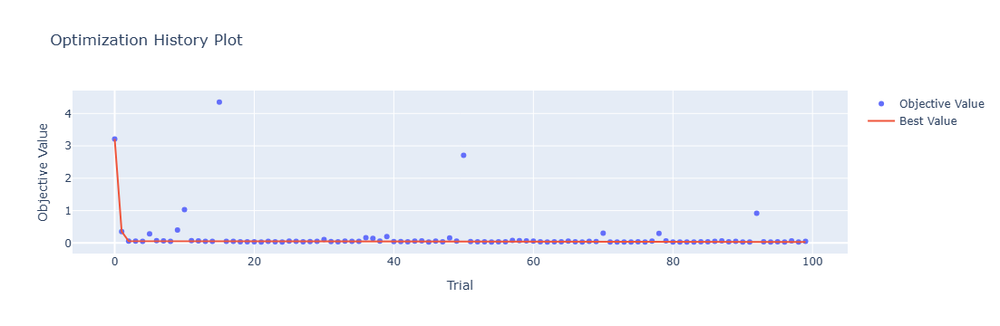

In [4]:
optuna.visualization.plot_optimization_history(study)

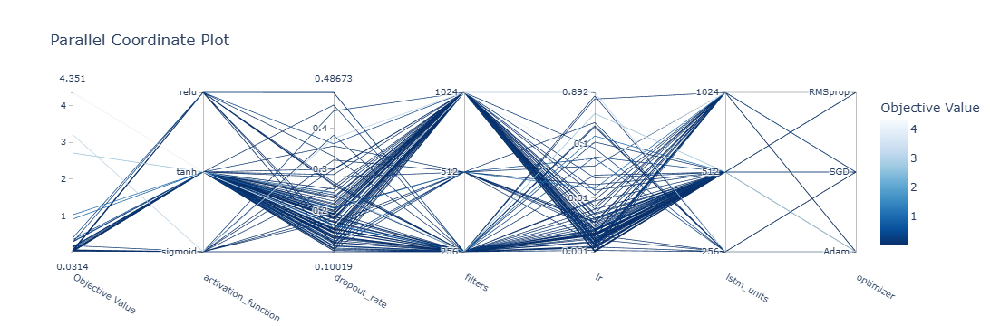

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

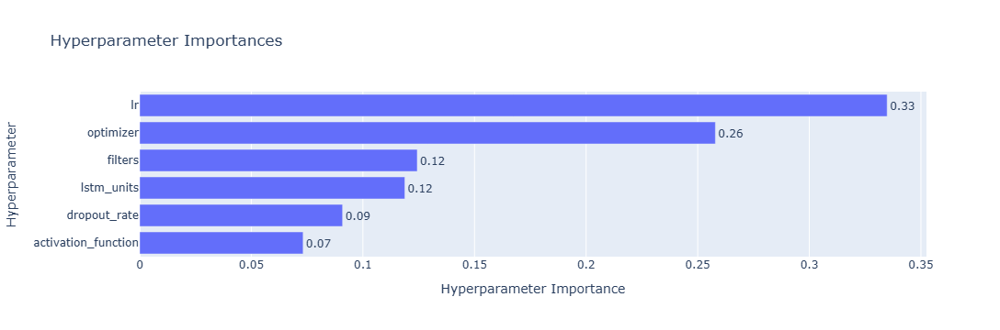

In [6]:
optuna.visualization.plot_param_importances(study)

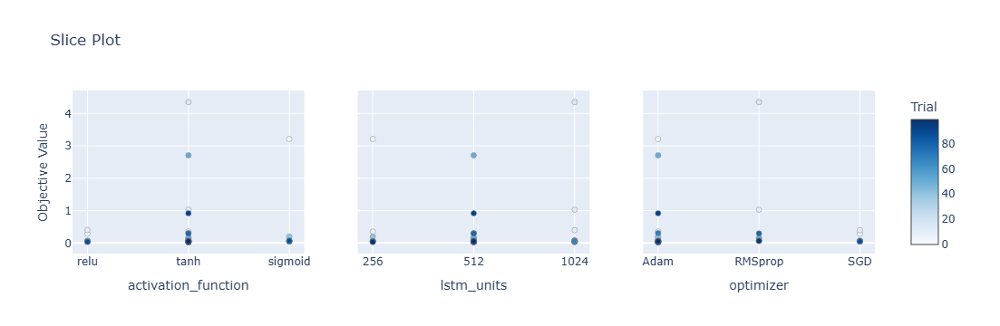

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

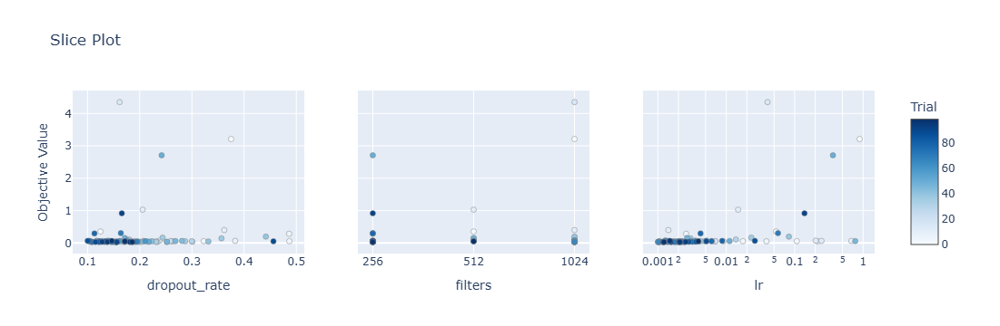

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate', 'filters'])

[[ 5.39  4.3   6.51 ... 13.73  8.35  9.05]
 [ 8.03  6.78  8.21 ... 17.14 11.74 12.27]
 [ 5.48  4.27  5.49 ... 13.3   9.17  8.6 ]
 ...
 [ 4.55  3.1   4.22 ... 12.8   7.91  6.65]
 [ 4.44  3.4   5.39 ... 12.34  7.74  6.78]
 [ 4.14  2.75  4.12 ... 10.6   7.07  6.41]]
Epoch 1/100
84/84 [==============================] - 19s 70ms/step - loss: 0.1716 - accuracy: 0.5000 - mae: 0.1489 - rmse: 0.1716 - mape: 25.7286 - pearson: 0.4556 - val_loss: 0.0628 - val_accuracy: 0.2000 - val_mae: 0.0507 - val_rmse: 0.0628 - val_mape: 8.1580 - val_pearson: 0.7274
Epoch 2/100
84/84 [==============================] - 2s 27ms/step - loss: 0.0906 - accuracy: 0.6905 - mae: 0.0759 - rmse: 0.0906 - mape: 12.8971 - pearson: 0.6460 - val_loss: 0.1385 - val_accuracy: 0.2000 - val_mae: 0.1266 - val_rmse: 0.1385 - val_mape: 23.5150 - val_pearson: 0.6748
Epoch 3/100
84/84 [==============================] - 2s 29ms/step - loss: 0.0730 - accuracy: 0.7381 - mae: 0.0609 - rmse: 0.0730 - mape: 10.4124 - pearson: 0.7354 - val

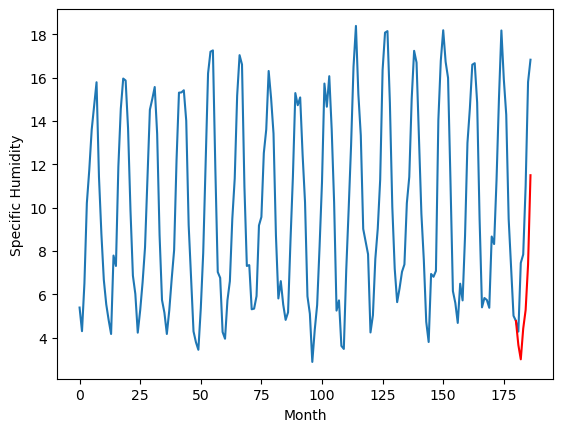

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.74		4.91		-0.83
6.45		4.25		-2.20
8.66		5.67		-2.99
8.88		6.53		-2.35
11.37		8.62		-2.75
16.12		12.75		-3.37
[180, 181, 182, 183, 184, 185, 186]
[7.05, 4.910730555057525, 4.2505466485023495, 5.666176035404205, 6.527092769145965, 8.615666224956513, 12.748667075634003]


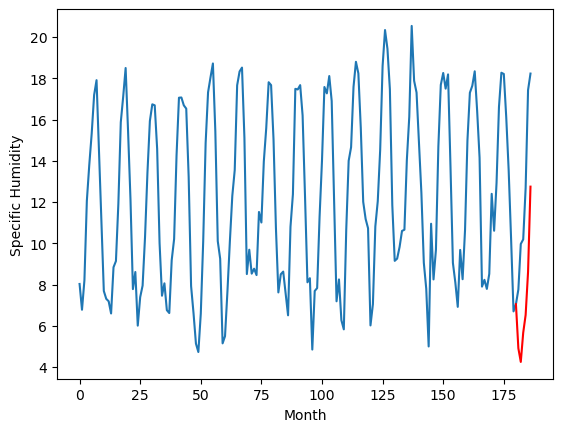

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.41		7.55		-0.86
8.56		6.89		-1.67
10.41		8.31		-2.10
10.65		9.17		-1.48
13.41		11.26		-2.15
18.03		15.39		-2.64
[180, 181, 182, 183, 184, 185, 186]
[5.06, 7.550730555057525, 6.890546648502349, 8.306176035404205, 9.167092769145965, 11.255666224956512, 15.388666121959686]


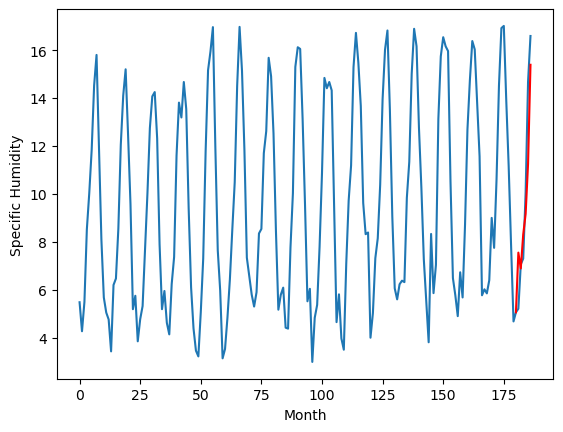

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.55		5.00		-0.55
5.46		4.34		-1.12
8.91		5.76		-3.15
9.48		6.62		-2.86
12.99		8.71		-4.28
16.89		12.84		-4.05
[180, 181, 182, 183, 184, 185, 186]
[7.05, 5.000730555057526, 4.34054664850235, 5.756176035404206, 6.617092769145966, 8.705666224956513, 12.838666121959687]


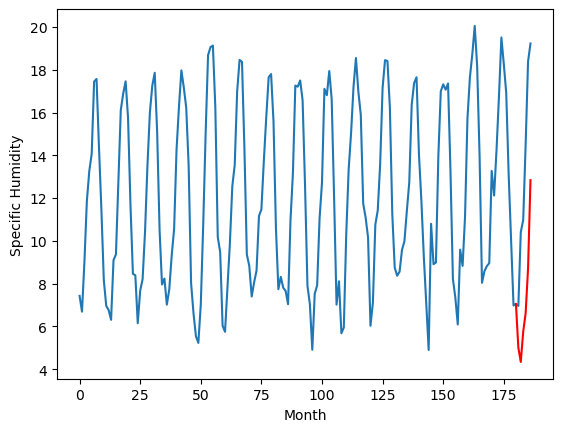

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.36		6.95		-0.41
6.96		6.29		-0.67
9.80		7.71		-2.09
11.20		8.57		-2.63
15.21		10.66		-4.55
18.90		14.79		-4.11
[180, 181, 182, 183, 184, 185, 186]
[5.2, 6.950730555057525, 6.29054664850235, 7.706176035404205, 8.567092769145965, 10.655667178630829, 14.788666121959686]


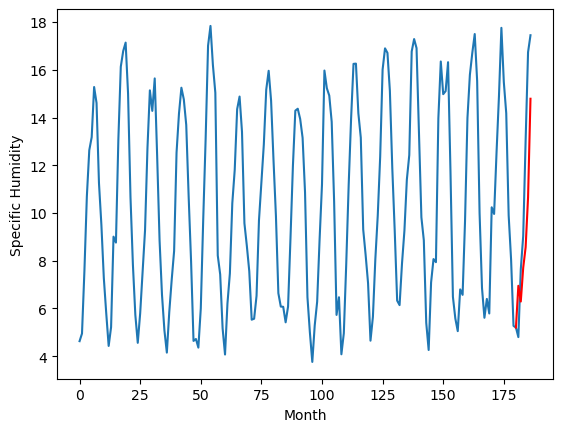

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.02		4.15		0.13
4.61		3.49		-1.12
6.18		4.91		-1.27
7.19		5.77		-1.42
9.69		7.86		-1.83
14.95		11.99		-2.96
[180, 181, 182, 183, 184, 185, 186]
[5.16, 4.1507305550575255, 3.4905466485023497, 4.906176035404205, 5.767093782424927, 7.85566819190979, 11.988668088912963]


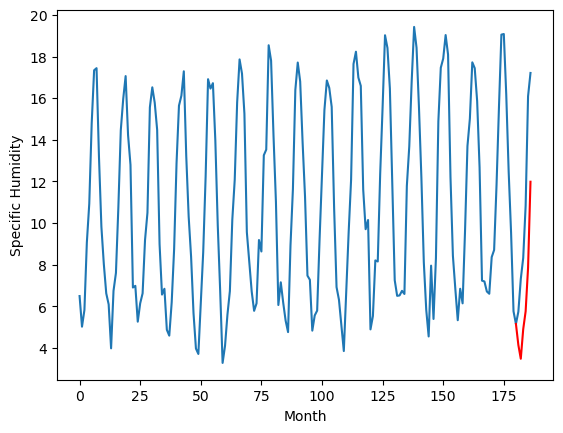

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.35		6.02		-0.33
6.40		5.36		-1.04
7.99		6.78		-1.21
8.59		7.64		-0.95
11.59		9.73		-1.86
15.97		13.86		-2.11
[180, 181, 182, 183, 184, 185, 186]
[4.05, 6.020731031894684, 5.360547125339508, 6.7761765122413635, 7.637094259262085, 9.725668668746948, 13.858668565750122]


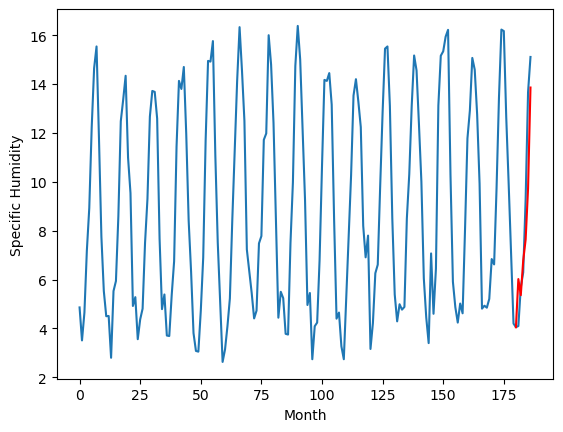

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.55		4.38		-0.17
4.58		3.72		-0.86
6.20		5.14		-1.06
6.90		6.00		-0.90
9.92		8.09		-1.83
14.19		12.22		-1.97
[180, 181, 182, 183, 184, 185, 186]
[3.64, 4.380730555057526, 3.72054664850235, 5.136176035404206, 5.997092769145966, 8.085667178630828, 12.218667075634002]


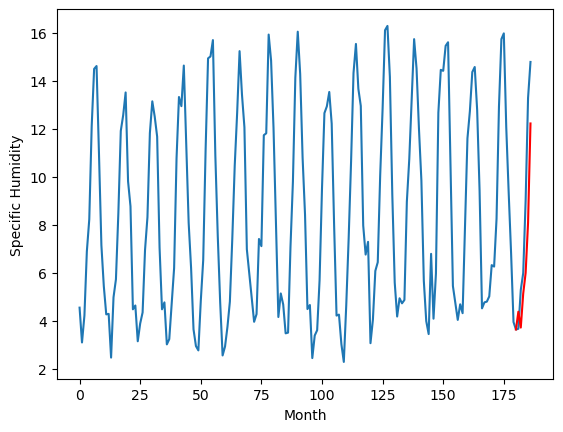

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.32		4.07		-0.25
3.64		3.41		-0.23
6.70		4.83		-1.87
7.43		5.69		-1.74
10.34		7.78		-2.56
15.32		11.91		-3.41
[180, 181, 182, 183, 184, 185, 186]
[3.46, 4.0707305550575255, 3.4105456948280333, 4.826175081729889, 5.68709282875061, 7.775666284561157, 11.908665227890015]


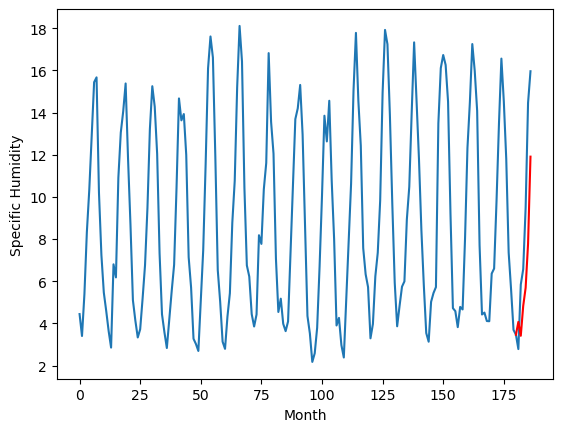

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.11		3.96		-0.15
3.66		3.30		-0.36
5.46		4.72		-0.74
6.78		5.58		-1.20
8.87		7.67		-1.20
13.64		11.80		-1.84
[180, 181, 182, 183, 184, 185, 186]
[2.93, 3.960730555057526, 3.300545694828034, 4.716175081729889, 5.57709181547165, 7.665666224956513, 11.798665168285371]


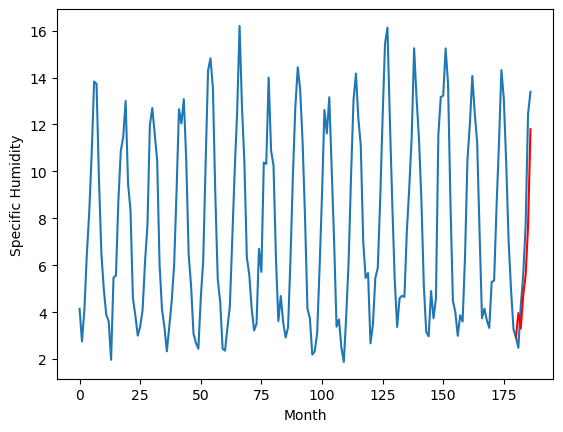

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.76		3.66		-0.10
3.02		3.00		-0.02
4.64		4.42		-0.22
6.24		5.28		-0.96
7.76		7.37		-0.39
12.89		11.50		-1.39
[180, 181, 182, 183, 184, 185, 186]
[2.74, 3.660730078220367, 3.0005461716651913, 4.416175558567047, 5.277093305587768, 7.365668668746948, 11.498667612075806]


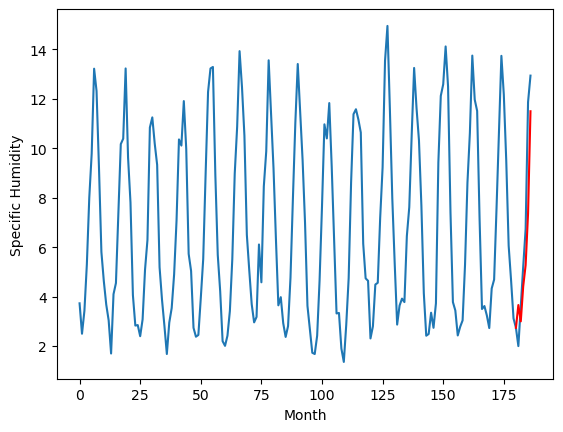

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.90   3.660731
1                 1    5.74   4.910731
2                 2    8.41   7.550731
3                 3    5.55   5.000731
4                 4    7.36   6.950731
5                 5    4.02   4.150731
6                 6    6.35   6.020731
7                 7    4.55   4.380731
8                 8    4.32   4.070731
9                 9    4.11   3.960731
10               10    3.76   3.660730


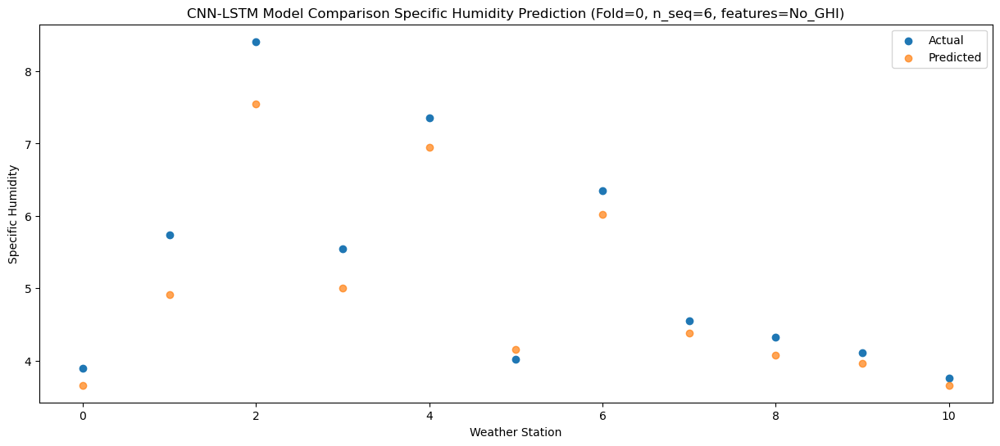

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.41   3.000547
1                 1    6.45   4.250547
2                 2    8.56   6.890547
3                 3    5.46   4.340547
4                 4    6.96   6.290547
5                 5    4.61   3.490547
6                 6    6.40   5.360547
7                 7    4.58   3.720547
8                 8    3.64   3.410546
9                 9    3.66   3.300546
10               10    3.02   3.000546


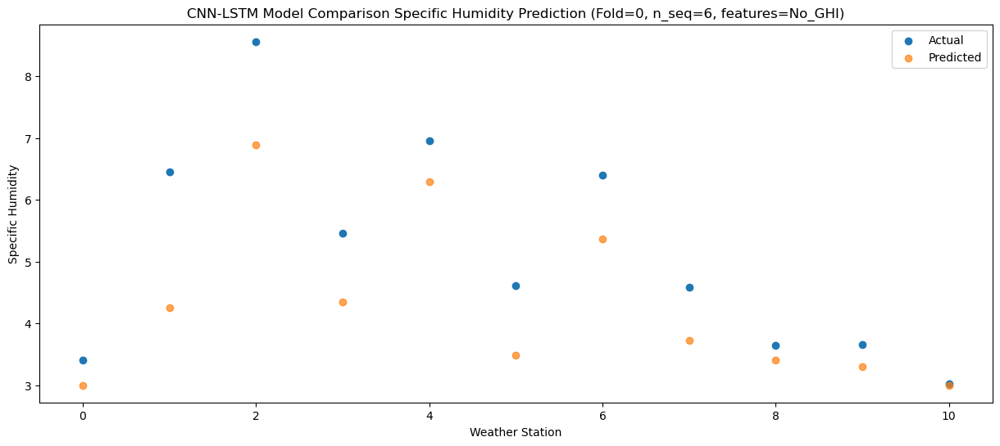

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.58   4.416177
1                 1    8.66   5.666176
2                 2   10.41   8.306176
3                 3    8.91   5.756176
4                 4    9.80   7.706176
5                 5    6.18   4.906176
6                 6    7.99   6.776177
7                 7    6.20   5.136176
8                 8    6.70   4.826175
9                 9    5.46   4.716175
10               10    4.64   4.416176


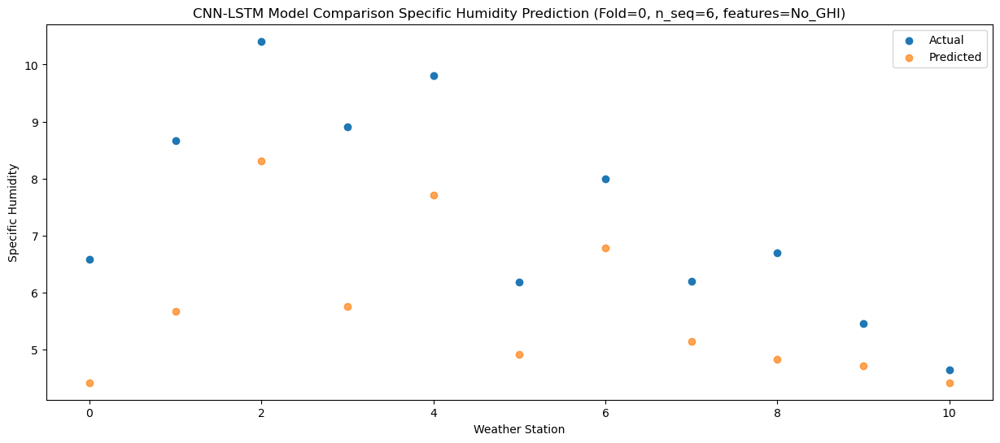

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.97   5.277094
1                 1    8.88   6.527093
2                 2   10.65   9.167093
3                 3    9.48   6.617093
4                 4   11.20   8.567093
5                 5    7.19   5.767094
6                 6    8.59   7.637094
7                 7    6.90   5.997093
8                 8    7.43   5.687093
9                 9    6.78   5.577092
10               10    6.24   5.277093


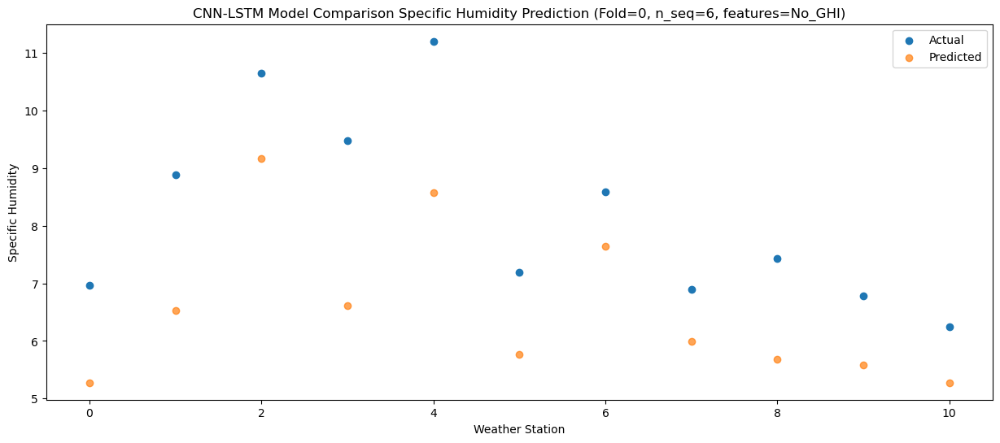

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.12   7.365668
1                 1   11.37   8.615666
2                 2   13.41  11.255666
3                 3   12.99   8.705666
4                 4   15.21  10.655667
5                 5    9.69   7.855668
6                 6   11.59   9.725669
7                 7    9.92   8.085667
8                 8   10.34   7.775666
9                 9    8.87   7.665666
10               10    7.76   7.365669


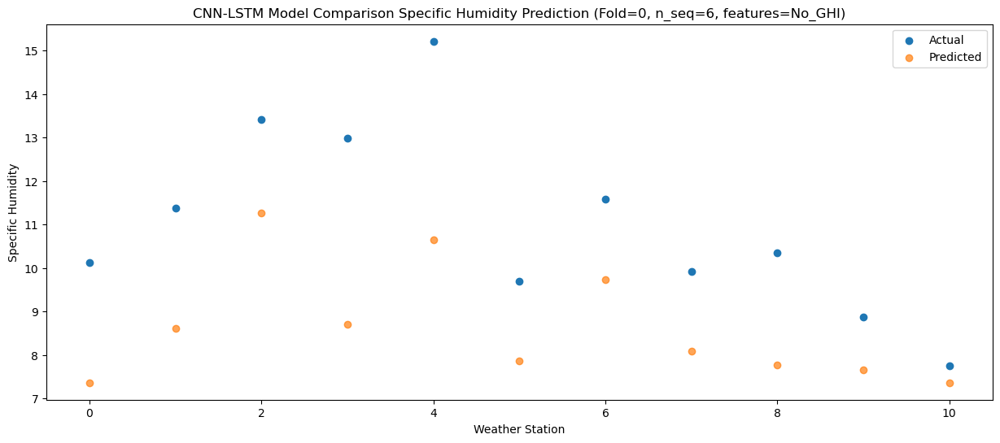

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.93  11.498667
1                 1   16.12  12.748667
2                 2   18.03  15.388666
3                 3   16.89  12.838666
4                 4   18.90  14.788666
5                 5   14.95  11.988668
6                 6   15.97  13.858669
7                 7   14.19  12.218667
8                 8   15.32  11.908665
9                 9   13.64  11.798665
10               10   12.89  11.498668


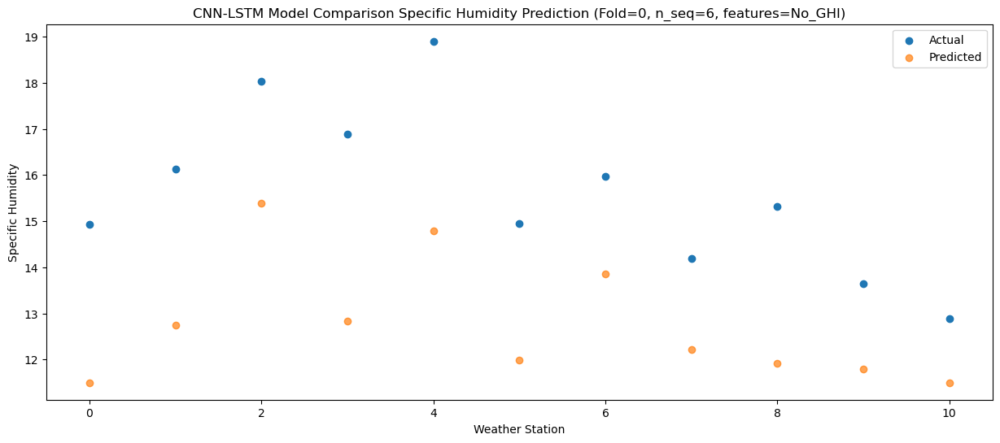

f, t:
[[ 3.9   5.74  8.41  5.55  7.36  4.02  6.35  4.55  4.32  4.11  3.76]
 [ 3.41  6.45  8.56  5.46  6.96  4.61  6.4   4.58  3.64  3.66  3.02]
 [ 6.58  8.66 10.41  8.91  9.8   6.18  7.99  6.2   6.7   5.46  4.64]
 [ 6.97  8.88 10.65  9.48 11.2   7.19  8.59  6.9   7.43  6.78  6.24]
 [10.12 11.37 13.41 12.99 15.21  9.69 11.59  9.92 10.34  8.87  7.76]
 [14.93 16.12 18.03 16.89 18.9  14.95 15.97 14.19 15.32 13.64 12.89]]
[[ 3.66073103  4.91073056  7.55073056  5.00073056  6.95073056  4.15073056
   6.02073103  4.38073056  4.07073056  3.96073056  3.66073008]
 [ 3.00054713  4.25054665  6.89054665  4.34054665  6.29054665  3.49054665
   5.36054713  3.72054665  3.41054569  3.30054569  3.00054617]
 [ 4.41617651  5.66617604  8.30617604  5.75617604  7.70617604  4.90617604
   6.77617651  5.13617604  4.82617508  4.71617508  4.41617556]
 [ 5.27709426  6.52709277  9.16709277  6.61709277  8.56709277  5.76709378
   7.63709426  5.99709277  5.68709283  5.57709182  5.27709331]
 [ 7.36566772  8.61566622 11.25

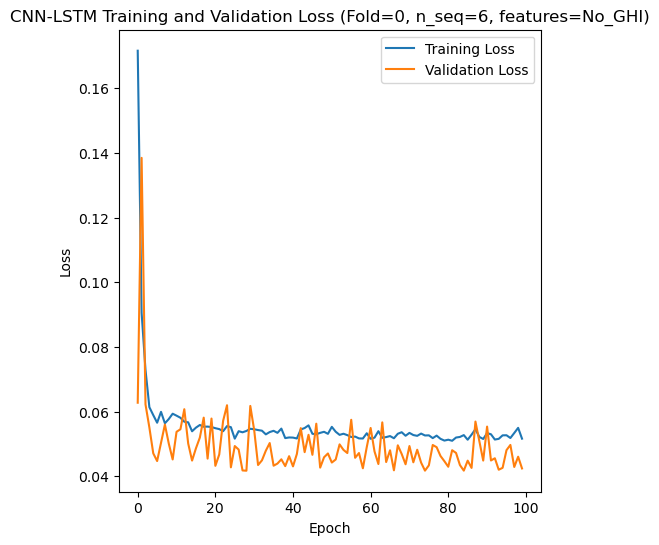

[[ 6.43  5.26  5.95 ... 15.04 10.09  9.76]
 [ 4.92  3.81  4.91 ... 12.52  8.69  7.9 ]
 [ 5.77  4.38  5.81 ... 14.28  9.78  9.52]
 ...
 [ 4.32  3.52  5.54 ... 12.    6.96  7.01]
 [ 3.07  3.12  5.08 ... 11.47  8.11  7.14]
 [ 2.37  2.06  3.5  ...  9.32  6.33  5.39]]
Epoch 1/100
84/84 [==============================] - 34s 141ms/step - loss: 0.1588 - accuracy: 0.6548 - mae: 0.1373 - rmse: 0.1588 - mape: 23.5313 - pearson: 0.4884 - val_loss: 0.0948 - val_accuracy: 0.7000 - val_mae: 0.0800 - val_rmse: 0.0948 - val_mape: 13.6202 - val_pearson: 0.3063
Epoch 2/100
84/84 [==============================] - 6s 69ms/step - loss: 0.0924 - accuracy: 0.6905 - mae: 0.0772 - rmse: 0.0924 - mape: 13.0895 - pearson: 0.6575 - val_loss: 0.0648 - val_accuracy: 0.7000 - val_mae: 0.0506 - val_rmse: 0.0648 - val_mape: 8.4413 - val_pearson: 0.7044
Epoch 3/100
84/84 [==============================] - 6s 74ms/step - loss: 0.0696 - accuracy: 0.8571 - mae: 0.0581 - rmse: 0.0696 - mape: 9.9111 - pearson: 0.7897 - val

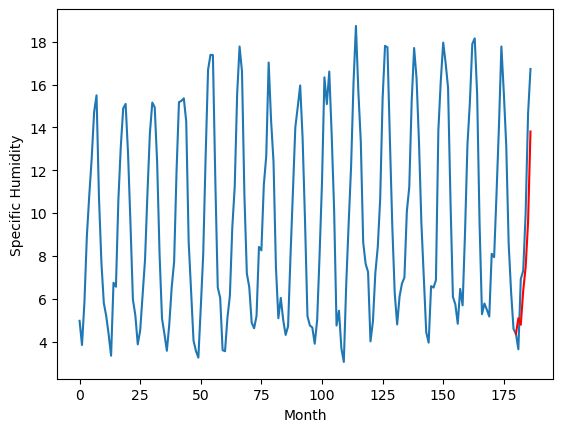

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		5.00		0.08
4.24		4.69		0.45
6.09		6.28		0.19
6.21		7.37		1.16
11.33		9.48		-1.85
14.24		13.72		-0.52
[180, 181, 182, 183, 184, 185, 186]
[2.82, 5.002977174967527, 4.694388133734464, 6.283244473189115, 7.374930602759123, 9.479989749640225, 13.721813899725674]


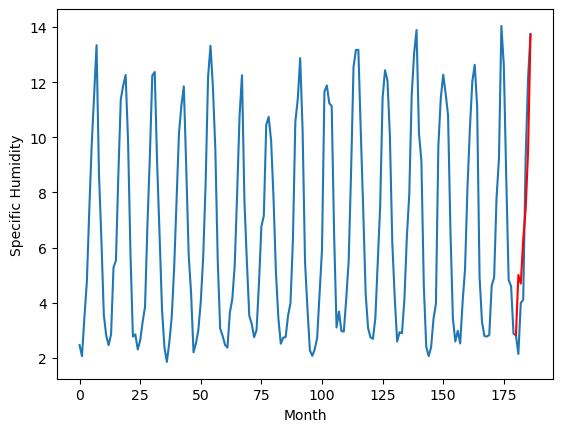

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.95		2.49		-0.46
5.08		2.18		-2.90
5.30		3.77		-1.53
6.27		4.86		-1.41
7.58		6.97		-0.61
11.36		11.21		-0.15
[180, 181, 182, 183, 184, 185, 186]
[9.16, 2.4929771749675274, 2.1843881337344646, 3.7732444731891155, 4.864930602759123, 6.969989749640226, 11.21181294605136]


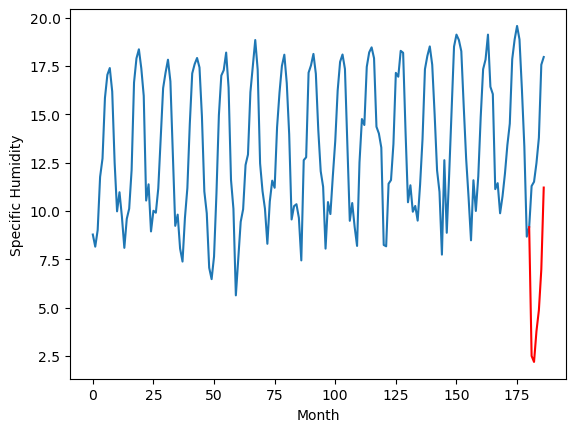

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.70		8.81		1.11
7.87		8.50		0.63
8.51		10.09		1.58
9.86		11.18		1.32
11.54		13.29		1.75
16.14		17.53		1.39
[180, 181, 182, 183, 184, 185, 186]
[2.44, 8.812978132367133, 8.50438909113407, 10.093245430588722, 11.184931560158729, 13.289990707039832, 17.531813903450967]


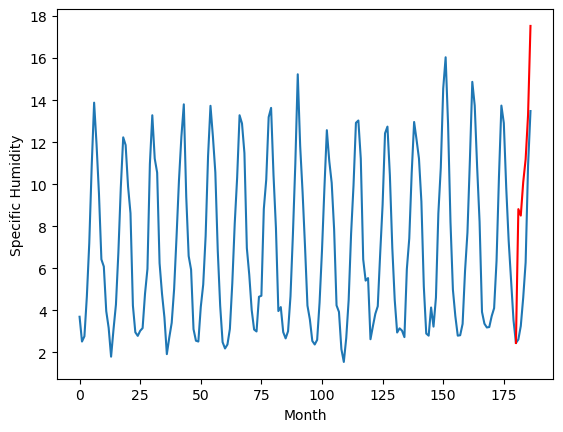

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.82		3.72		-0.10
3.80		3.41		-0.39
7.09		5.00		-2.09
7.11		6.09		-1.02
10.31		8.20		-2.11
14.20		12.44		-1.76
[180, 181, 182, 183, 184, 185, 186]
[6.65, 3.7229771749675273, 3.4143881337344646, 5.003243519514799, 6.094929649084806, 8.19998879596591, 12.441811992377042]


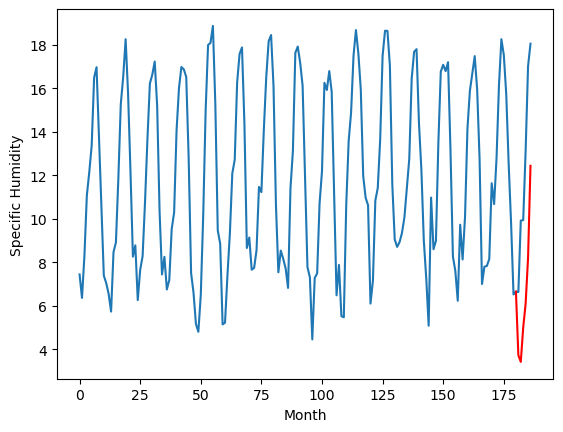

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.31		7.47		0.16
7.26		7.16		-0.10
10.25		8.75		-1.50
11.82		9.84		-1.98
16.65		11.95		-4.70
19.29		16.19		-3.10
[180, 181, 182, 183, 184, 185, 186]
[6.19, 7.4729781323671345, 7.1643886142969135, 8.753244953751565, 9.844931083321573, 11.949990230202676, 16.19181342661381]


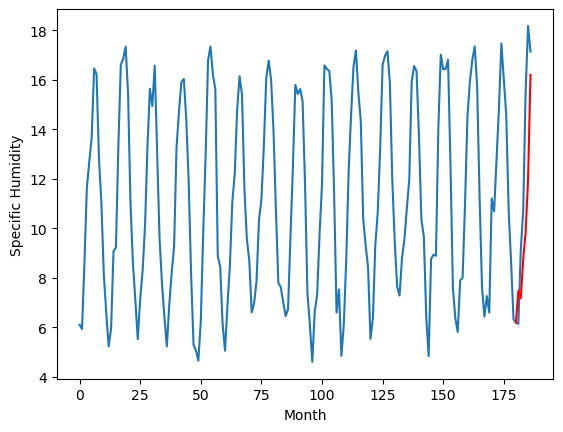

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.00		6.13		0.13
5.67		5.82		0.15
8.53		7.41		-1.12
9.85		8.50		-1.35
14.05		10.61		-3.44
17.80		14.85		-2.95
[180, 181, 182, 183, 184, 185, 186]
[4.78, 6.132977174967527, 5.824387656897306, 7.413243996351957, 8.504930125921964, 10.609989272803068, 14.8518124692142]


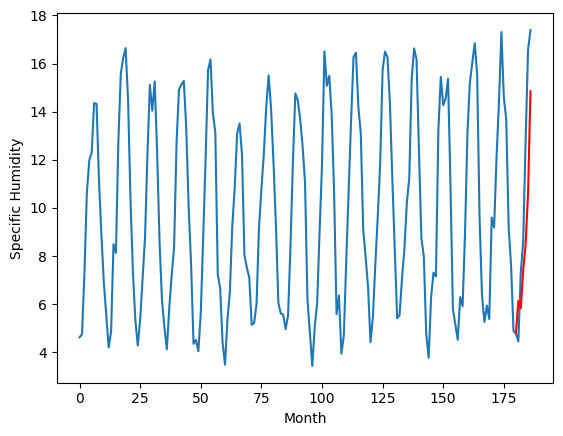

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.65		-0.25
4.77		4.34		-0.43
4.86		5.93		1.07
5.16		7.02		1.86
5.28		9.13		3.85
7.94		13.37		5.43
[180, 181, 182, 183, 184, 185, 186]
[2.61, 4.6529771749675275, 4.344388133734465, 5.933244473189116, 7.024930602759123, 9.129989749640227, 13.37181294605136]


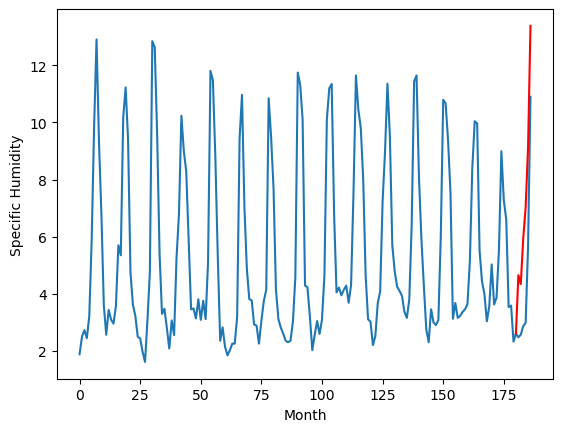

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.74		1.92		-0.82
3.27		1.61		-1.66
3.38		3.20		-0.18
4.70		4.29		-0.41
6.18		6.40		0.22
7.43		10.64		3.21
[180, 181, 182, 183, 184, 185, 186]
[4.6, 1.9229771749675273, 1.6143881337344645, 3.203244473189115, 4.2949306027591225, 6.399989749640226, 10.641813899725676]


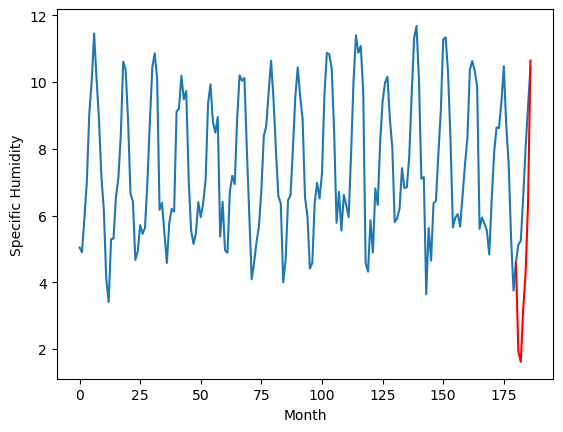

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		5.07		0.15
4.99		4.76		-0.23
6.72		6.35		-0.37
7.25		7.44		0.19
9.96		9.55		-0.41
14.46		13.79		-0.67
[180, 181, 182, 183, 184, 185, 186]
[4.27, 5.072978132367134, 4.764389091134071, 6.353245430588722, 7.44493156015873, 9.549990707039832, 13.791813903450965]


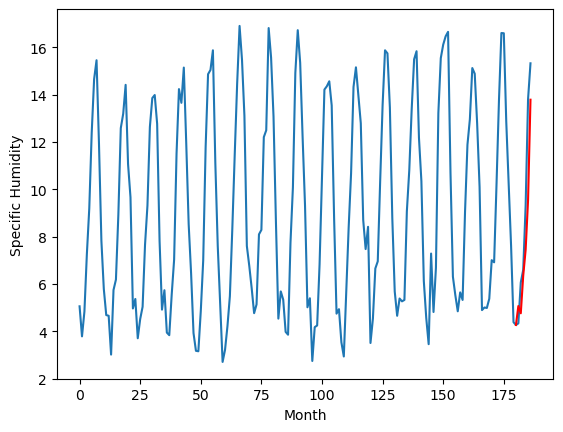

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.09		0.02
5.31		4.78		-0.53
6.34		6.37		0.03
6.95		7.46		0.51
9.62		9.57		-0.05
13.72		13.81		0.09
[180, 181, 182, 183, 184, 185, 186]
[3.91, 5.092978132367134, 4.784389091134071, 6.373245430588722, 7.464931560158729, 9.569990707039832, 13.811813903450965]


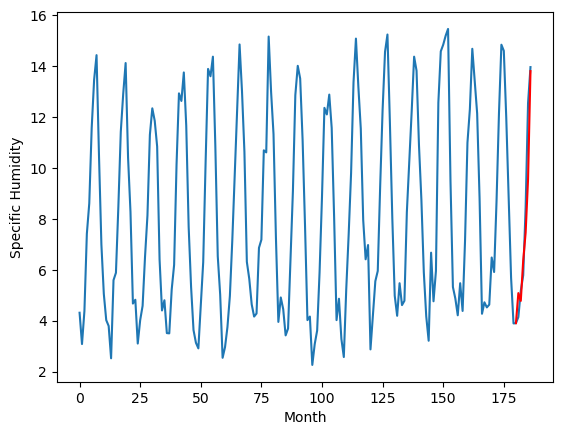

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.83   5.092978
1                 1    4.92   5.002977
2                 2    2.95   2.492977
3                 3    7.70   8.812978
4                 4    3.82   3.722977
5                 5    7.31   7.472978
6                 6    6.00   6.132977
7                 7    4.90   4.652977
8                 8    2.74   1.922977
9                 9    4.92   5.072978
10               10    5.07   5.092978


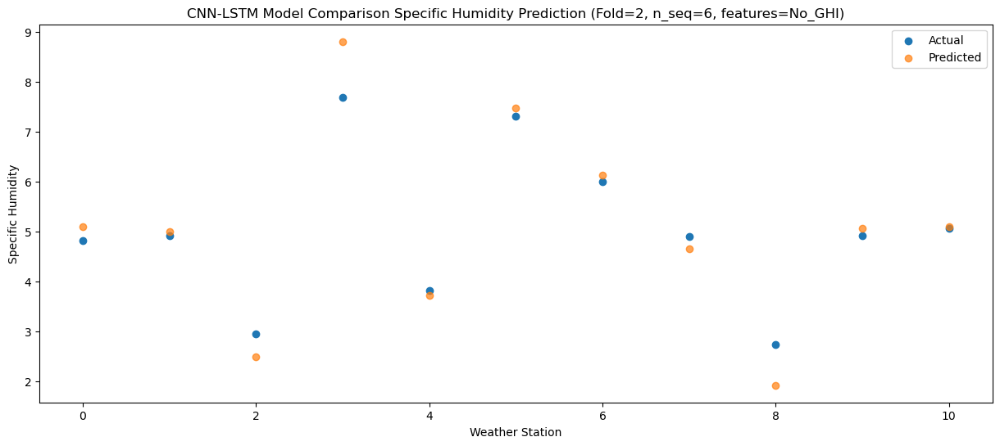

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.11   4.784390
1                 1    4.24   4.694388
2                 2    5.08   2.184388
3                 3    7.87   8.504389
4                 4    3.80   3.414388
5                 5    7.26   7.164389
6                 6    5.67   5.824388
7                 7    4.77   4.344388
8                 8    3.27   1.614388
9                 9    4.99   4.764389
10               10    5.31   4.784389


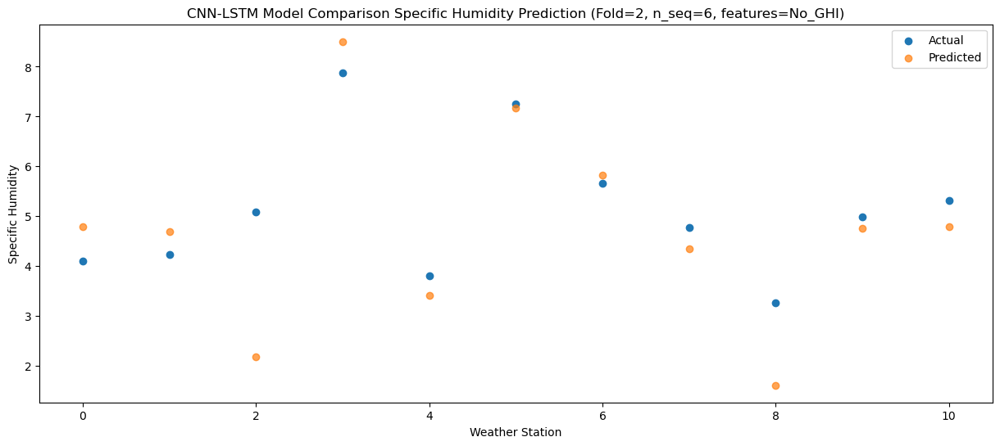

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.39   6.373246
1                 1    6.09   6.283244
2                 2    5.30   3.773244
3                 3    8.51  10.093245
4                 4    7.09   5.003244
5                 5   10.25   8.753245
6                 6    8.53   7.413244
7                 7    4.86   5.933244
8                 8    3.38   3.203244
9                 9    6.72   6.353245
10               10    6.34   6.373245


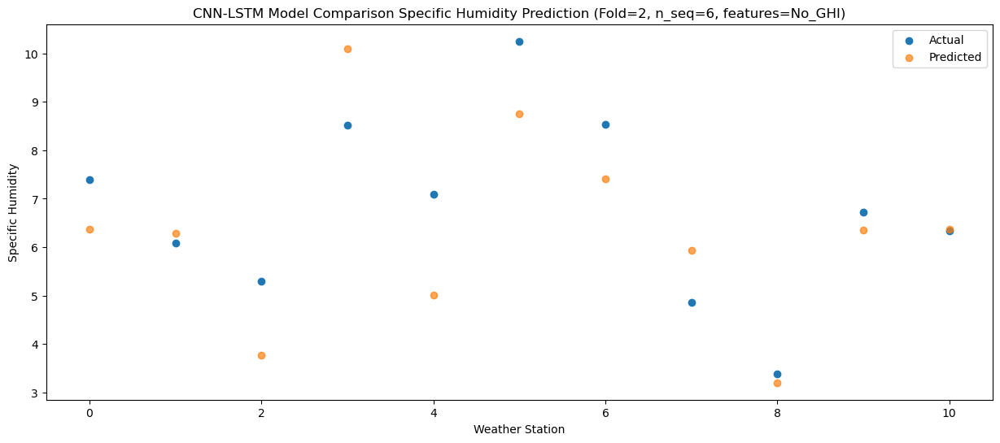

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.78   7.464932
1                 1    6.21   7.374931
2                 2    6.27   4.864931
3                 3    9.86  11.184932
4                 4    7.11   6.094930
5                 5   11.82   9.844931
6                 6    9.85   8.504930
7                 7    5.16   7.024931
8                 8    4.70   4.294931
9                 9    7.25   7.444932
10               10    6.95   7.464932


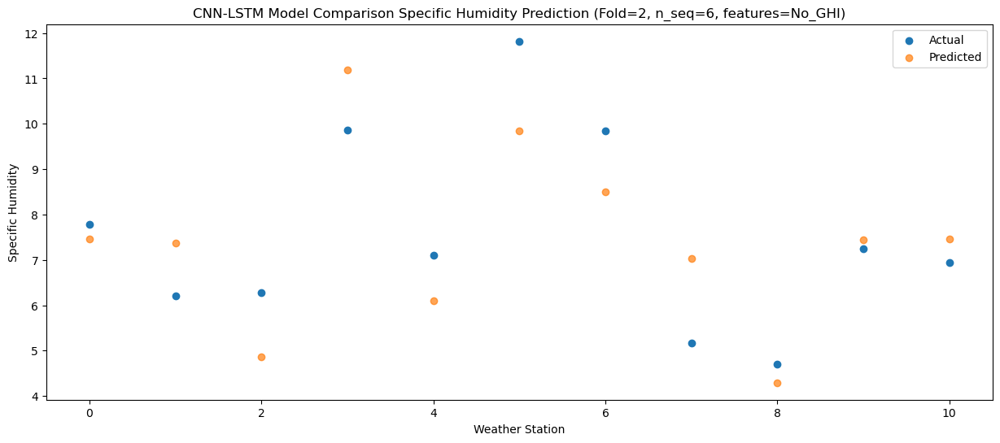

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.45   9.569991
1                 1   11.33   9.479990
2                 2    7.58   6.969990
3                 3   11.54  13.289991
4                 4   10.31   8.199989
5                 5   16.65  11.949990
6                 6   14.05  10.609989
7                 7    5.28   9.129990
8                 8    6.18   6.399990
9                 9    9.96   9.549991
10               10    9.62   9.569991


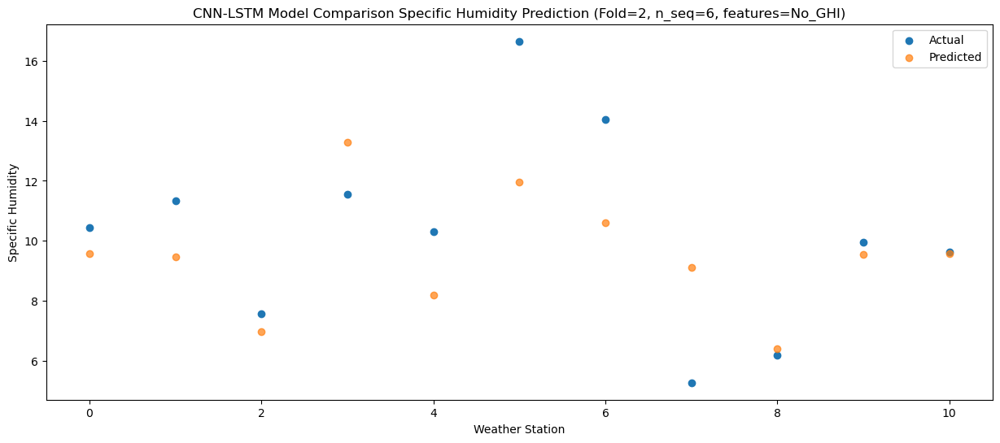

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.10  13.811814
1                 1   14.24  13.721814
2                 2   11.36  11.211813
3                 3   16.14  17.531814
4                 4   14.20  12.441812
5                 5   19.29  16.191813
6                 6   17.80  14.851812
7                 7    7.94  13.371813
8                 8    7.43  10.641814
9                 9   14.46  13.791814
10               10   13.72  13.811814


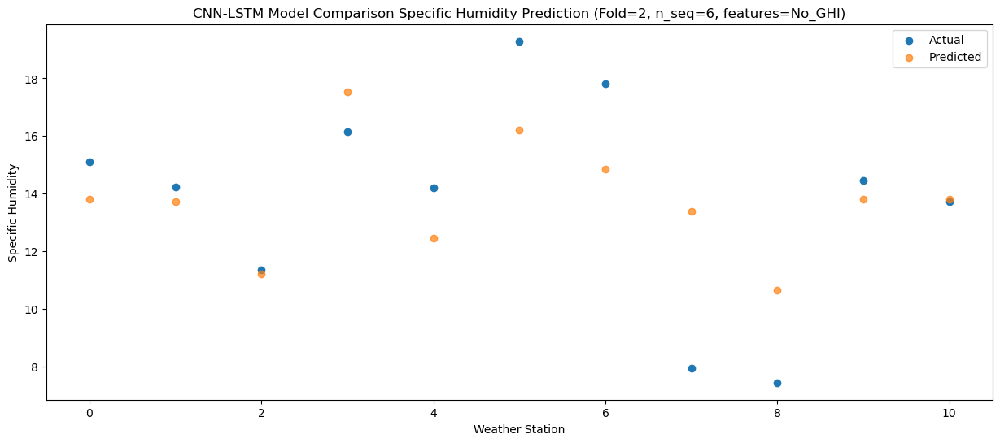

f, t:
[[ 4.83  4.92  2.95  7.7   3.82  7.31  6.    4.9   2.74  4.92  5.07]
 [ 4.11  4.24  5.08  7.87  3.8   7.26  5.67  4.77  3.27  4.99  5.31]
 [ 7.39  6.09  5.3   8.51  7.09 10.25  8.53  4.86  3.38  6.72  6.34]
 [ 7.78  6.21  6.27  9.86  7.11 11.82  9.85  5.16  4.7   7.25  6.95]
 [10.45 11.33  7.58 11.54 10.31 16.65 14.05  5.28  6.18  9.96  9.62]
 [15.1  14.24 11.36 16.14 14.2  19.29 17.8   7.94  7.43 14.46 13.72]]
[[ 5.09297813  5.00297717  2.49297717  8.81297813  3.72297717  7.47297813
   6.13297717  4.65297717  1.92297717  5.07297813  5.09297813]
 [ 4.78438957  4.69438813  2.18438813  8.50438909  3.41438813  7.16438861
   5.82438766  4.34438813  1.61438813  4.76438909  4.78438909]
 [ 6.37324591  6.28324447  3.77324447 10.09324543  5.00324352  8.75324495
   7.413244    5.93324447  3.20324447  6.35324543  6.37324543]
 [ 7.46493204  7.3749306   4.8649306  11.18493156  6.09492965  9.84493108
   8.50493013  7.0249306   4.2949306   7.44493156  7.46493156]
 [ 9.56999118  9.47998975  6.96

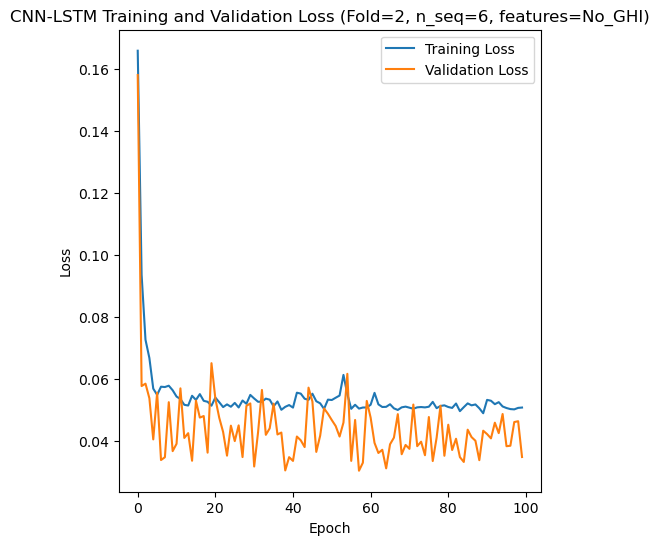

[[ 5.11  3.7   4.74 ... 13.5   8.68  7.66]
 [ 3.73  2.91  5.05 ... 11.19  6.96  6.57]
 [ 5.56  5.41  5.55 ...  8.56  7.45  5.59]
 ...
 [ 2.73  2.21  3.23 ...  5.    3.95  3.09]
 [ 5.93  5.59  5.49 ...  8.63  7.04  6.11]
 [ 3.71  2.55  2.84 ...  9.78  6.68  4.77]]
Epoch 1/100
84/84 [==============================] - 33s 140ms/step - loss: 0.1675 - accuracy: 0.4643 - mae: 0.1456 - rmse: 0.1675 - mape: 24.7774 - pearson: 0.4765 - val_loss: 0.0848 - val_accuracy: 0.1000 - val_mae: 0.0670 - val_rmse: 0.0848 - val_mape: 11.6775 - val_pearson: 0.2661
Epoch 2/100
84/84 [==============================] - 6s 72ms/step - loss: 0.0777 - accuracy: 0.7143 - mae: 0.0640 - rmse: 0.0777 - mape: 10.7186 - pearson: 0.6897 - val_loss: 0.0850 - val_accuracy: 0.9000 - val_mae: 0.0676 - val_rmse: 0.0850 - val_mape: 12.7321 - val_pearson: 0.6083
Epoch 3/100
84/84 [==============================] - 7s 79ms/step - loss: 0.0730 - accuracy: 0.6786 - mae: 0.0612 - rmse: 0.0730 - mape: 10.3098 - pearson: 0.7398 - v

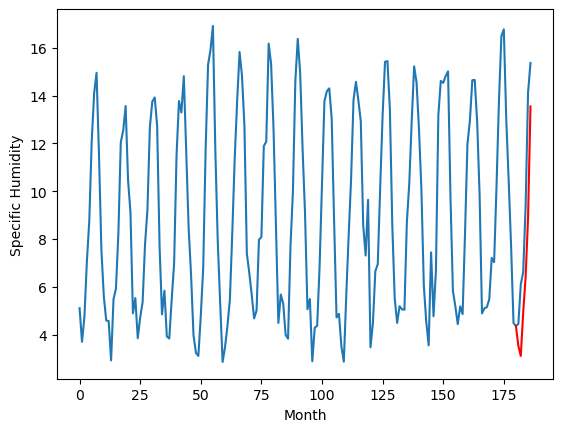

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.02		4.93		-0.09
4.46		4.51		0.05
6.97		6.33		-0.64
8.14		7.82		-0.32
11.66		10.29		-1.37
16.19		14.94		-1.25
[180, 181, 182, 183, 184, 185, 186]
[3.43, 4.928006038665772, 4.510420039892197, 6.333145216703415, 7.8206899917125705, 10.291200474500656, 14.944374397993087]


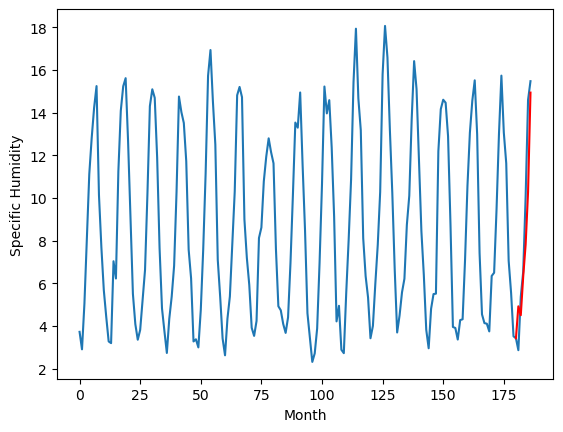

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.17		3.55		-0.62
4.11		3.13		-0.98
4.19		4.95		0.76
4.81		6.44		1.63
5.21		8.91		3.70
7.66		13.56		5.90
[180, 181, 182, 183, 184, 185, 186]
[5.43, 3.5480190920829773, 3.130438904762268, 4.953169803619385, 6.440711717605591, 8.911236743927002, 13.564403038024903]


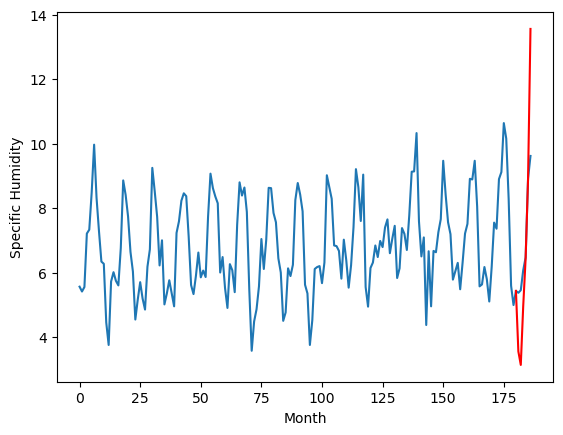

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.29		5.38		0.09
5.22		4.96		-0.26
6.52		6.78		0.26
7.71		8.27		0.56
10.24		10.74		0.50
15.66		15.39		-0.27
[180, 181, 182, 183, 184, 185, 186]
[3.21, 5.377997828125953, 4.9604050642251964, 6.7831263071298595, 8.27067203581333, 10.74117083609104, 15.394346666932105]


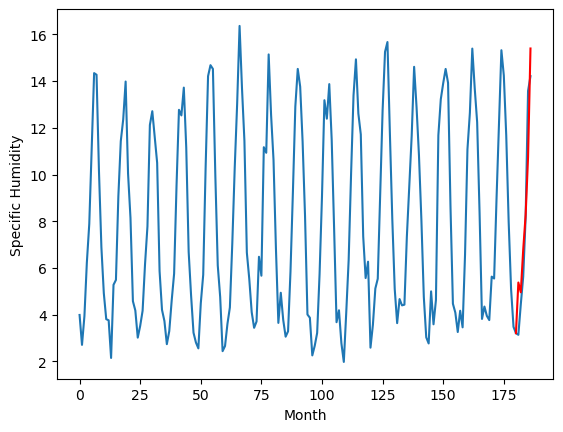

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.79		3.81		0.02
2.96		3.39		0.43
5.44		5.21		-0.23
6.50		6.70		0.20
8.92		9.17		0.25
13.38		13.82		0.44
[180, 181, 182, 183, 184, 185, 186]
[3.04, 3.8080041164159777, 3.3904152268171313, 5.213138377070427, 6.700684105753899, 9.171192681193352, 13.824366604685784]


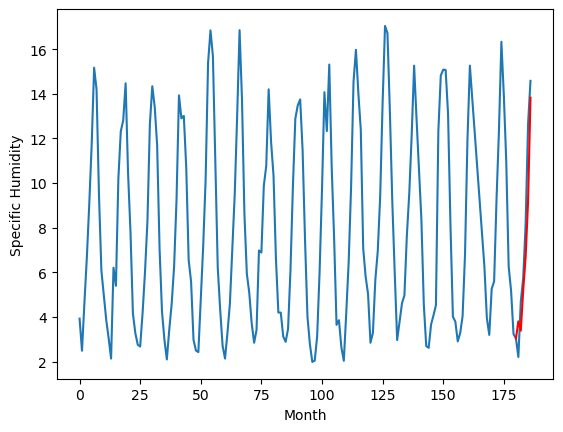

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.62		3.75		0.13
3.10		3.33		0.23
5.13		5.15		0.02
6.43		6.64		0.21
8.67		9.11		0.44
13.89		13.76		-0.13
[180, 181, 182, 183, 184, 185, 186]
[2.91, 3.7480002421140672, 3.330408431887627, 5.153130628466606, 6.640677310824394, 9.111180164217949, 13.764355995059013]


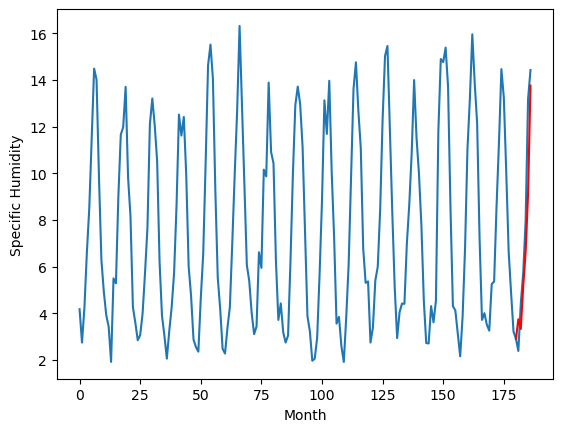

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		4.00		-0.35
4.41		3.58		-0.83
4.72		5.40		0.68
5.19		6.89		1.70
6.59		9.36		2.77
7.92		14.01		6.09
[180, 181, 182, 183, 184, 185, 186]
[1.6, 3.9980147409439084, 3.580432616472244, 5.403161607980728, 6.890703521966934, 9.36122473359108, 14.014392935037613]


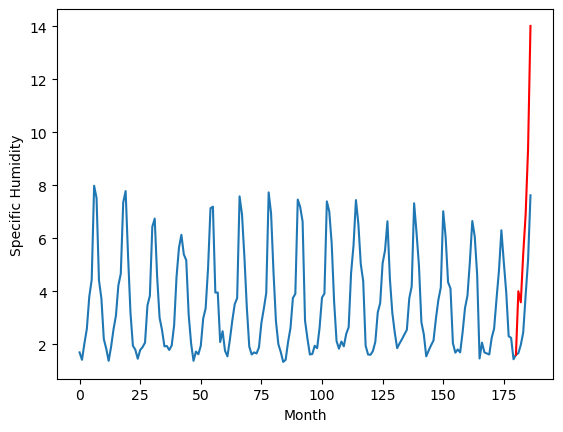

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.50		1.51		-0.99
2.02		1.09		-0.93
2.32		2.91		0.59
2.01		4.40		2.39
2.57		6.87		4.30
3.99		11.52		7.53
[180, 181, 182, 183, 184, 185, 186]
[2.86, 1.5080210292339324, 1.0904437327384948, 2.9131776118278503, 4.400719525814056, 6.871248366832733, 11.524414660930633]


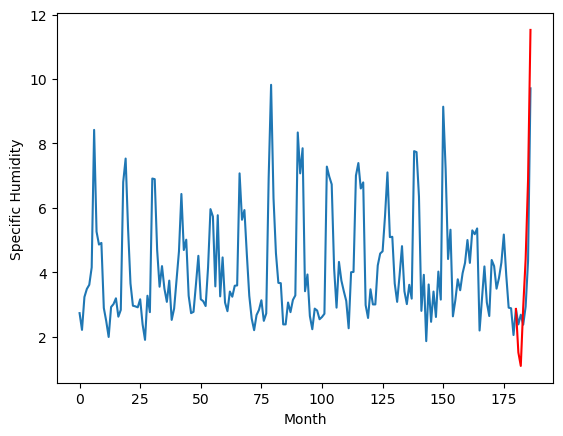

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.40		2.55		-0.85
3.05		2.13		-0.92
2.70		3.95		1.25
3.63		5.44		1.81
4.07		7.91		3.84
5.50		12.56		7.06
[180, 181, 182, 183, 184, 185, 186]
[5.65, 2.5480147409439087, 2.1304326164722442, 3.953161607980728, 5.440703521966935, 7.911223779916764, 12.564390074014664]


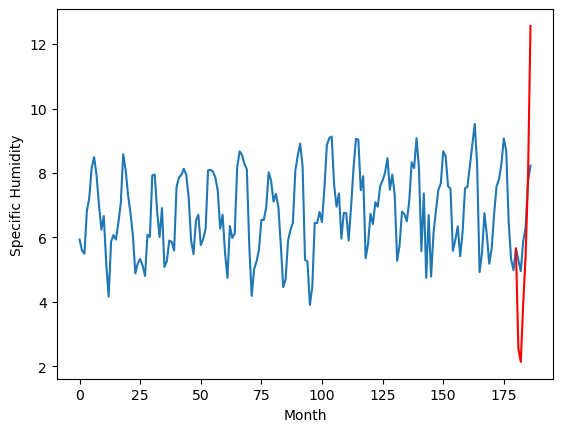

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.75		0.91
4.99		5.33		0.34
5.77		7.15		1.38
7.15		8.64		1.49
8.72		11.11		2.39
13.62		15.76		2.14
[180, 181, 182, 183, 184, 185, 186]
[2.54, 5.747998304963112, 5.330405541062355, 7.153125830292701, 8.640671558976173, 11.111169405579567, 15.764345236420631]


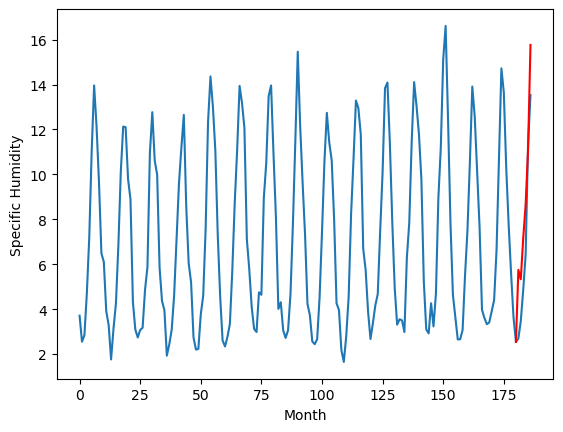

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.02		3.53		0.51
2.88		3.11		0.23
4.16		4.93		0.77
5.57		6.42		0.85
7.16		8.89		1.73
12.03		13.54		1.51
[180, 181, 182, 183, 184, 185, 186]
[2.51, 3.527996382713318, 3.1104026651382446, 4.933122954368591, 6.420668683052063, 8.891167483329774, 13.544343314170838]


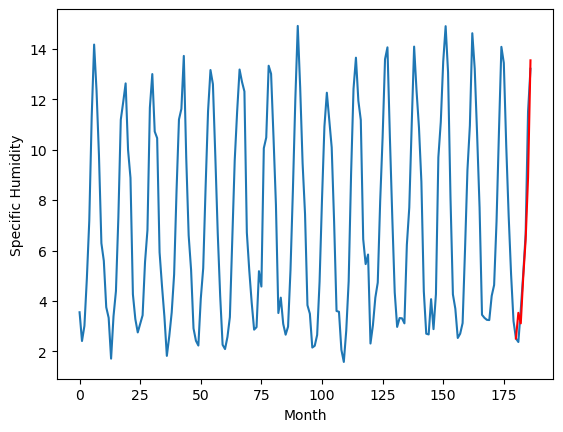

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.58   3.527996
1                 1    5.02   4.928006
2                 2    4.17   3.548019
3                 3    5.29   5.377998
4                 4    3.79   3.808004
5                 5    3.62   3.748000
6                 6    4.35   3.998015
7                 7    2.50   1.508021
8                 8    3.40   2.548015
9                 9    4.84   5.747998
10               10    3.02   3.527996


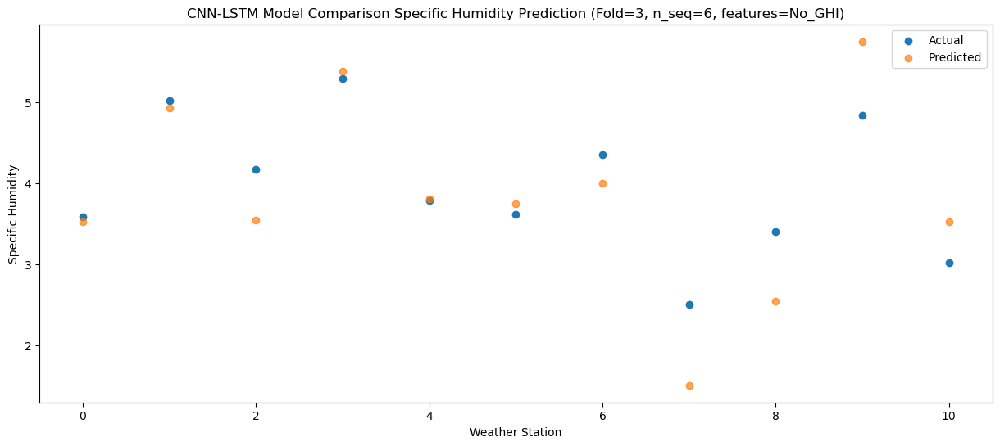

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   3.110402
1                 1    4.46   4.510420
2                 2    4.11   3.130439
3                 3    5.22   4.960405
4                 4    2.96   3.390415
5                 5    3.10   3.330408
6                 6    4.41   3.580433
7                 7    2.02   1.090444
8                 8    3.05   2.130433
9                 9    4.99   5.330406
10               10    2.88   3.110403


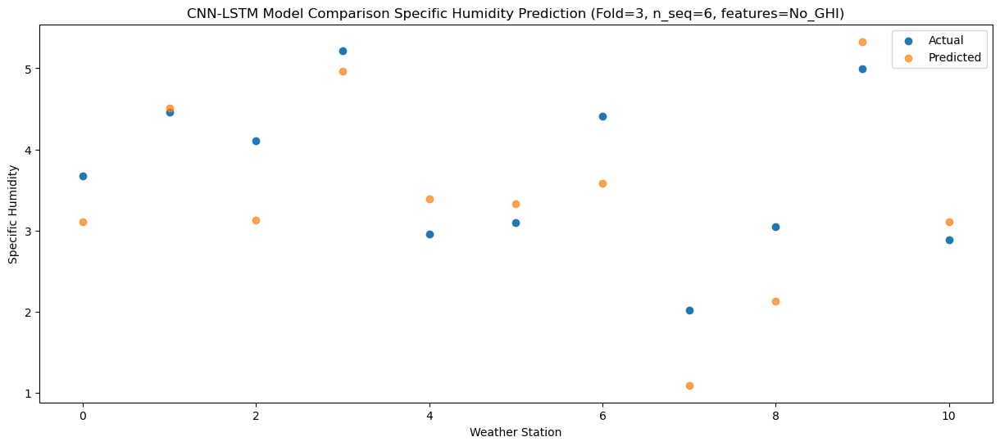

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.32   4.933122
1                 1    6.97   6.333145
2                 2    4.19   4.953170
3                 3    6.52   6.783126
4                 4    5.44   5.213138
5                 5    5.13   5.153131
6                 6    4.72   5.403162
7                 7    2.32   2.913178
8                 8    2.70   3.953162
9                 9    5.77   7.153126
10               10    4.16   4.933123


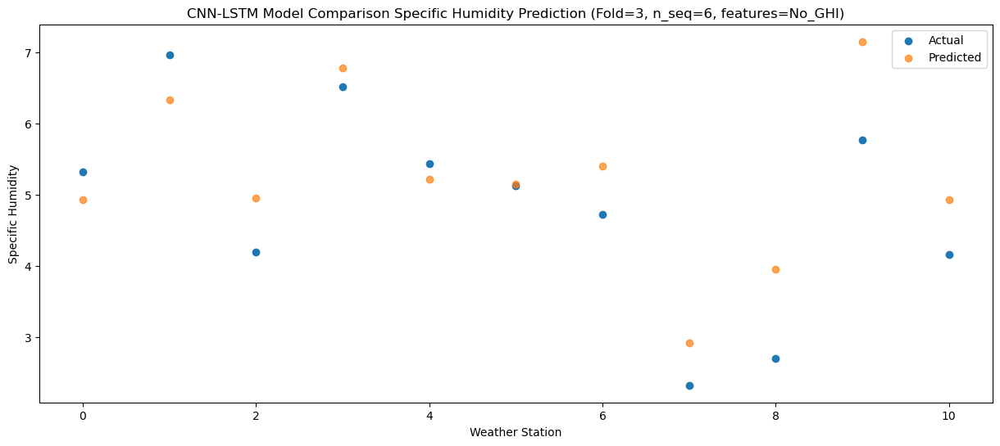

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    5.84   6.420669
1                 1    8.14   7.820690
2                 2    4.81   6.440712
3                 3    7.71   8.270672
4                 4    6.50   6.700684
5                 5    6.43   6.640677
6                 6    5.19   6.890704
7                 7    2.01   4.400720
8                 8    3.63   5.440704
9                 9    7.15   8.640672
10               10    5.57   6.420669


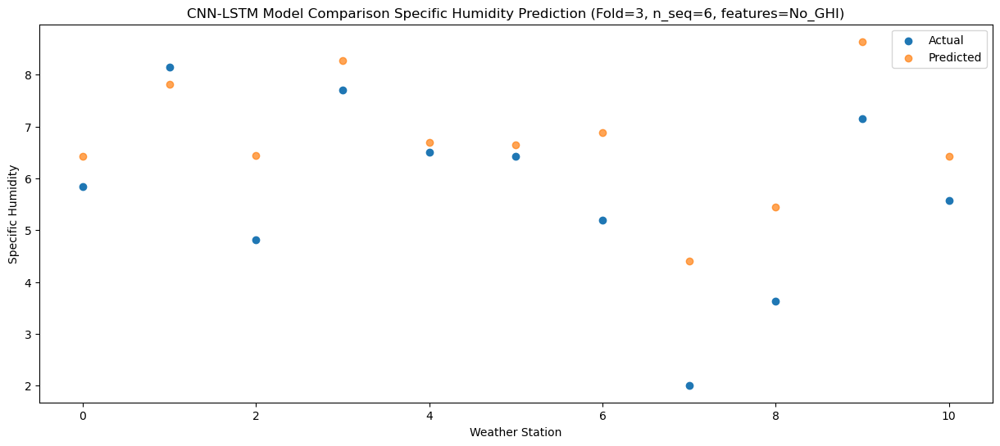

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    8.62   8.891168
1                 1   11.66  10.291200
2                 2    5.21   8.911237
3                 3   10.24  10.741171
4                 4    8.92   9.171193
5                 5    8.67   9.111180
6                 6    6.59   9.361225
7                 7    2.57   6.871248
8                 8    4.07   7.911224
9                 9    8.72  11.111169
10               10    7.16   8.891167


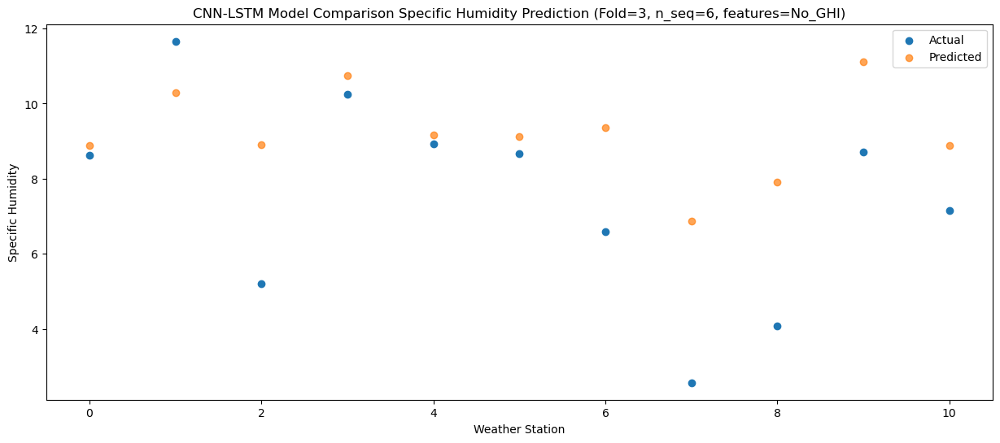

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   13.34  13.544344
1                 1   16.19  14.944374
2                 2    7.66  13.564403
3                 3   15.66  15.394347
4                 4   13.38  13.824367
5                 5   13.89  13.764356
6                 6    7.92  14.014393
7                 7    3.99  11.524415
8                 8    5.50  12.564390
9                 9   13.62  15.764345
10               10   12.03  13.544343


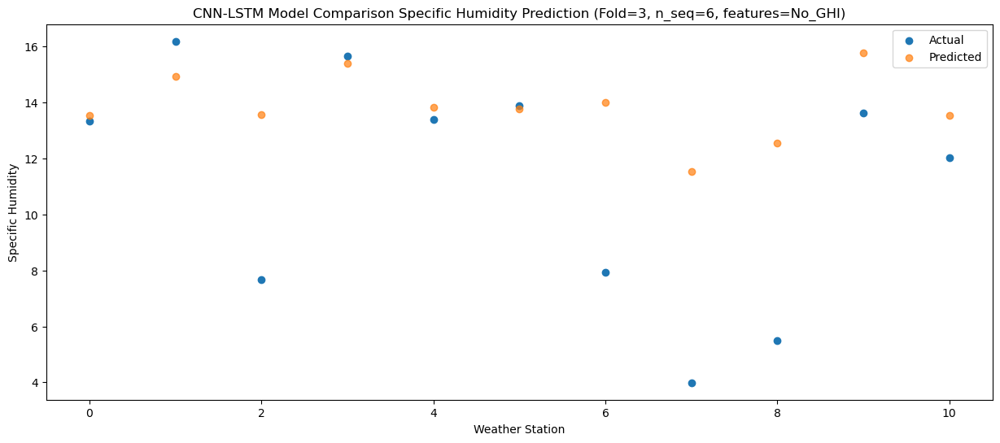

f, t:
[[ 3.58  5.02  4.17  5.29  3.79  3.62  4.35  2.5   3.4   4.84  3.02]
 [ 3.67  4.46  4.11  5.22  2.96  3.1   4.41  2.02  3.05  4.99  2.88]
 [ 5.32  6.97  4.19  6.52  5.44  5.13  4.72  2.32  2.7   5.77  4.16]
 [ 5.84  8.14  4.81  7.71  6.5   6.43  5.19  2.01  3.63  7.15  5.57]
 [ 8.62 11.66  5.21 10.24  8.92  8.67  6.59  2.57  4.07  8.72  7.16]
 [13.34 16.19  7.66 15.66 13.38 13.89  7.92  3.99  5.5  13.62 12.03]]
[[ 3.52799589  4.92800604  3.54801909  5.37799783  3.80800412  3.74800024
   3.99801474  1.50802103  2.54801474  5.7479983   3.52799638]
 [ 3.11040217  4.51042004  3.1304389   4.96040506  3.39041523  3.33040843
   3.58043262  1.09044373  2.13043262  5.33040554  3.11040267]
 [ 4.93312246  6.33314522  4.9531698   6.78312631  5.21313838  5.15313063
   5.40316161  2.91317761  3.95316161  7.15312583  4.93312295]
 [ 6.42066914  7.82068999  6.44071172  8.27067204  6.70068411  6.64067731
   6.89070352  4.40071953  5.44070352  8.64067156  6.42066868]
 [ 8.89116795 10.29120047  8.91

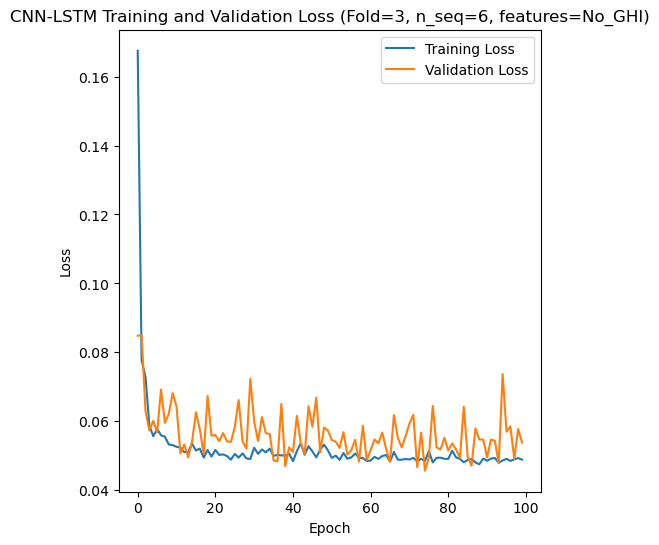

[[ 3.4   2.19  4.28 ... 10.54  6.41  5.39]
 [ 7.94  7.22  7.86 ... 18.27 13.85 11.85]
 [ 5.92  4.91  6.84 ... 14.38  9.59 10.48]
 ...
 [ 3.92  3.    4.93 ... 11.51  7.19  6.46]
 [ 3.98  2.61  4.   ... 10.23  6.65  5.8 ]
 [ 3.84  2.35  4.25 ... 10.6   6.5   5.9 ]]
Epoch 1/100
84/84 [==============================] - 31s 147ms/step - loss: 0.1705 - accuracy: 0.5119 - mae: 0.1460 - rmse: 0.1705 - mape: 25.3193 - pearson: 0.4589 - val_loss: 0.0910 - val_accuracy: 0.0000e+00 - val_mae: 0.0746 - val_rmse: 0.0910 - val_mape: 12.7571 - val_pearson: 0.3202
Epoch 2/100
84/84 [==============================] - 5s 59ms/step - loss: 0.0866 - accuracy: 0.6667 - mae: 0.0714 - rmse: 0.0866 - mape: 12.0364 - pearson: 0.6449 - val_loss: 0.0645 - val_accuracy: 1.0000 - val_mae: 0.0563 - val_rmse: 0.0645 - val_mape: 9.6315 - val_pearson: 0.6965
Epoch 3/100
84/84 [==============================] - 6s 71ms/step - loss: 0.0752 - accuracy: 0.7738 - mae: 0.0623 - rmse: 0.0752 - mape: 10.4310 - pearson: 0.7226 

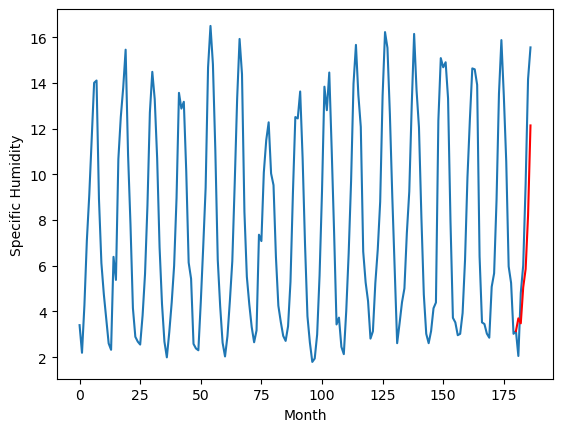

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.75		3.26		-0.49
5.74		3.04		-2.70
5.71		4.61		-1.10
6.46		5.41		-1.05
7.79		7.76		-0.03
12.08		11.70		-0.38
[180, 181, 182, 183, 184, 185, 186]
[7.79, 3.2583128601312636, 3.039626905322075, 4.613400408625603, 5.413868793845177, 7.759383329749108, 11.703335651755333]


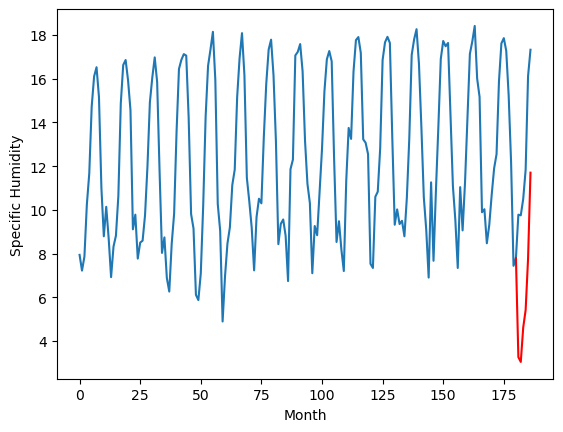

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.83		7.80		-0.03
7.71		7.58		-0.13
10.77		9.15		-1.62
11.02		9.95		-1.07
14.46		12.30		-2.16
18.70		16.24		-2.46
[180, 181, 182, 183, 184, 185, 186]
[5.03, 7.798312860131264, 7.579626905322075, 9.153400408625604, 9.953868793845178, 12.299383329749109, 16.243335651755334]


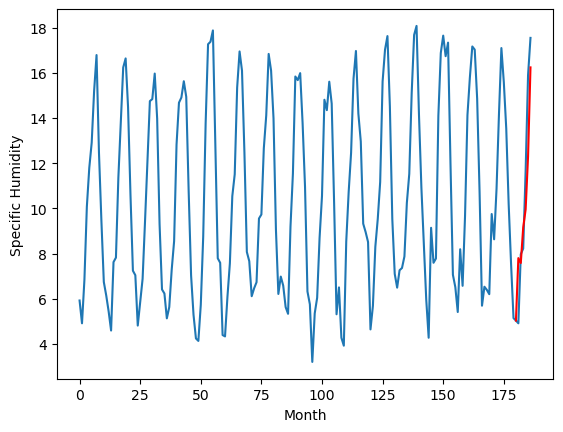

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.81		5.78		-0.03
5.49		5.56		0.07
8.15		7.13		-1.02
9.44		7.93		-1.51
13.44		10.28		-3.16
17.13		14.22		-2.91
[180, 181, 182, 183, 184, 185, 186]
[4.41, 5.778312860131264, 5.559626905322075, 7.133400408625603, 7.933868793845177, 10.279383329749107, 14.2233337444067]


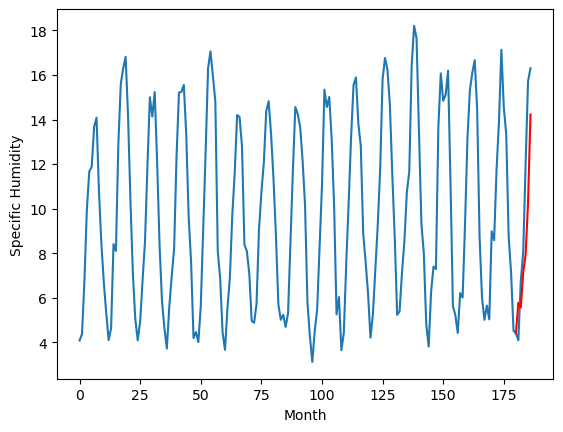

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.04		3.94		-0.10
3.59		3.72		0.13
6.17		5.29		-0.88
7.53		6.09		-1.44
11.82		8.44		-3.38
15.70		12.38		-3.32
[180, 181, 182, 183, 184, 185, 186]
[4.29, 3.938312860131264, 3.719626905322075, 5.293400408625603, 6.093868793845177, 8.439383329749107, 12.3833337444067]


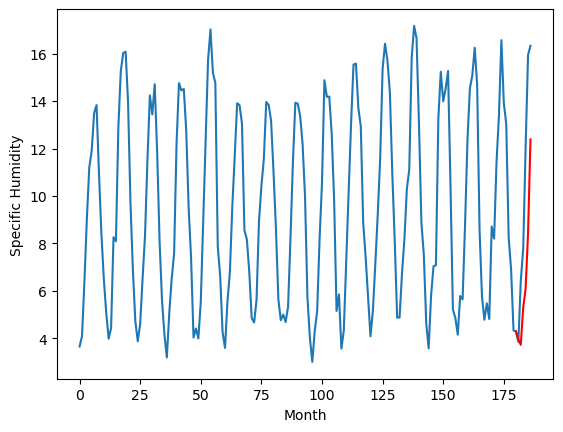

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		3.51		-0.84
3.71		3.29		-0.42
5.20		4.86		-0.34
6.16		5.66		-0.50
10.71		8.01		-2.70
13.01		11.95		-1.06
[180, 181, 182, 183, 184, 185, 186]
[3.47, 3.5083128601312636, 3.289626905322075, 4.863400408625603, 5.663868793845177, 8.009382376074791, 11.953332790732384]


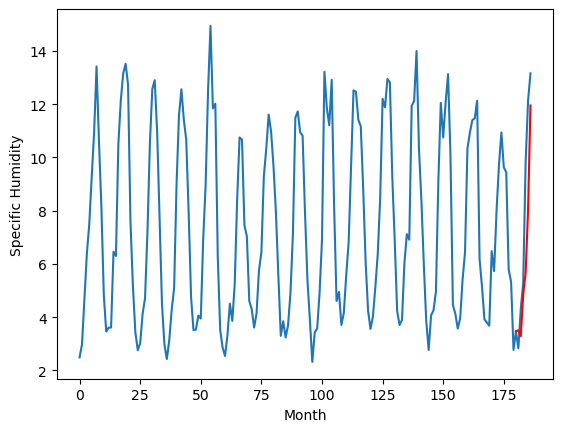

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.37		2.35		-0.02
2.62		2.13		-0.49
4.33		3.70		-0.63
4.74		4.50		-0.24
7.72		6.85		-0.87
12.41		10.79		-1.62
[180, 181, 182, 183, 184, 185, 186]
[4.52, 2.348313336968422, 2.1296273821592333, 3.7033999317884447, 4.503868317008019, 6.849382852911949, 10.793335174918175]


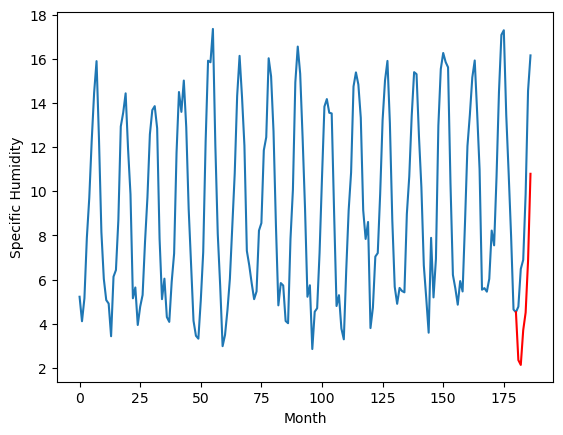

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.08		0.01
4.44		4.86		0.42
6.81		6.43		-0.38
7.73		7.23		-0.50
10.89		9.58		-1.31
15.49		13.52		-1.97
[180, 181, 182, 183, 184, 185, 186]
[3.4, 5.0783128601312635, 4.859626905322075, 6.4334004086256025, 7.2338687938451764, 9.579383329749106, 13.523335651755332]


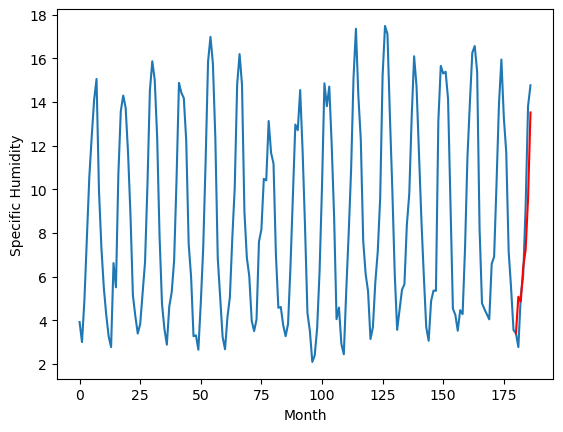

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.57		3.78		0.21
3.00		3.56		0.56
4.94		5.13		0.19
6.27		5.93		-0.34
8.56		8.28		-0.28
13.62		12.22		-1.40
[180, 181, 182, 183, 184, 185, 186]
[2.82, 3.778313336968422, 3.559627382159233, 5.1333999317884444, 5.933868317008018, 8.279382852911949, 12.223335174918175]


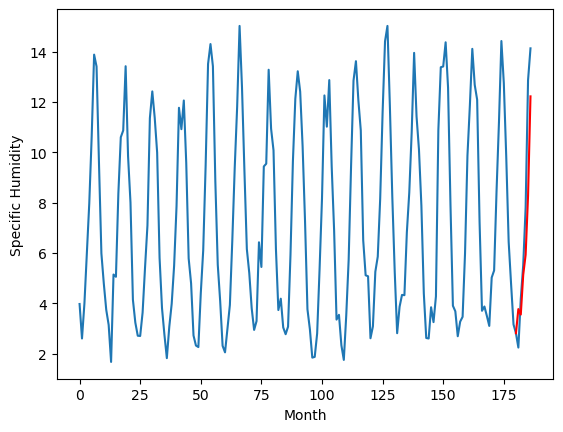

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.66		3.84		0.18
3.02		3.62		0.60
5.39		5.19		-0.20
6.70		5.99		-0.71
9.32		8.34		-0.98
14.07		12.28		-1.79
[180, 181, 182, 183, 184, 185, 186]
[2.86, 3.838313336968422, 3.619627382159233, 5.193399931788445, 5.993868317008019, 8.33938285291195, 12.283335174918175]


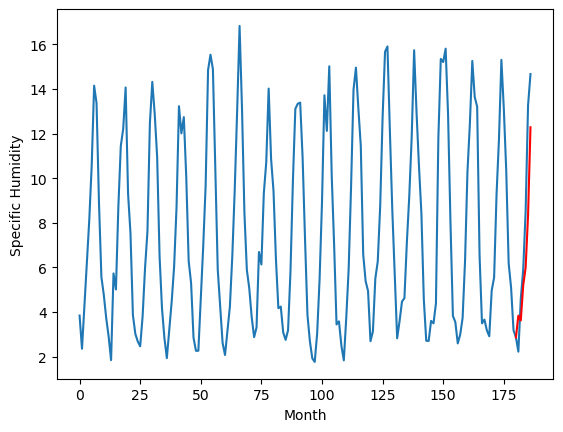

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.46		3.70		0.24
2.89		3.48		0.59
4.18		5.05		0.87
5.85		5.85		0.00
7.45		8.20		0.75
12.46		12.14		-0.32
[180, 181, 182, 183, 184, 185, 186]
[2.61, 3.698313336968422, 3.479627382159233, 5.053399931788444, 5.853868317008018, 8.199382852911949, 12.143335174918175]


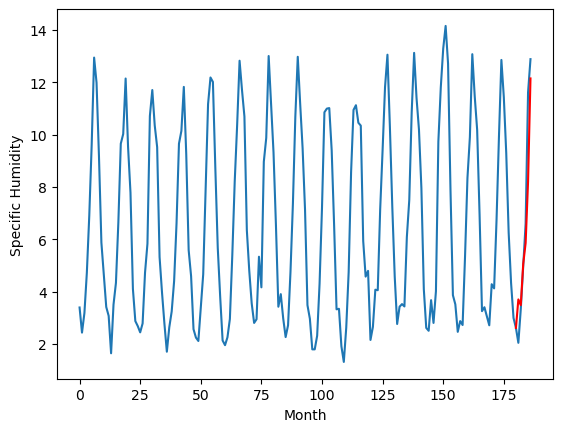

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.96   3.698313
1                 1    3.75   3.258313
2                 2    7.83   7.798313
3                 3    5.81   5.778313
4                 4    4.04   3.938313
5                 5    4.35   3.508313
6                 6    2.37   2.348313
7                 7    5.07   5.078313
8                 8    3.57   3.778313
9                 9    3.66   3.838313
10               10    3.46   3.698313


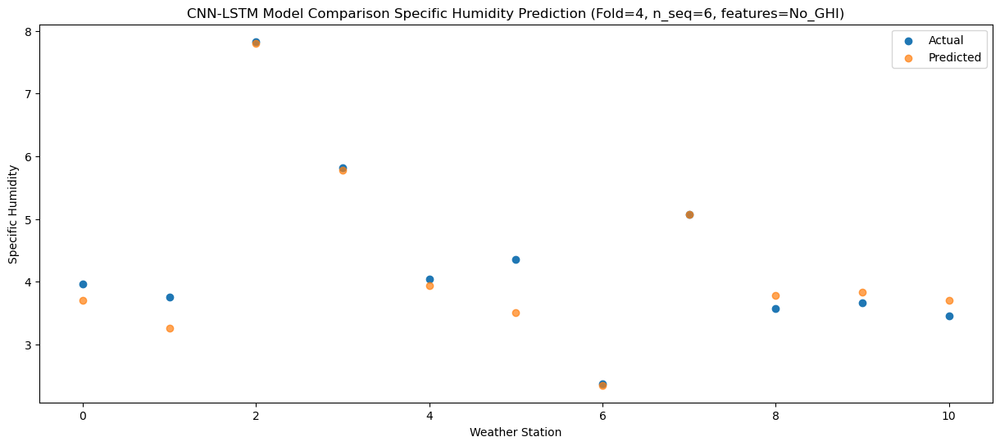

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.87   3.479627
1                 1    5.74   3.039627
2                 2    7.71   7.579627
3                 3    5.49   5.559627
4                 4    3.59   3.719627
5                 5    3.71   3.289627
6                 6    2.62   2.129627
7                 7    4.44   4.859627
8                 8    3.00   3.559627
9                 9    3.02   3.619627
10               10    2.89   3.479627


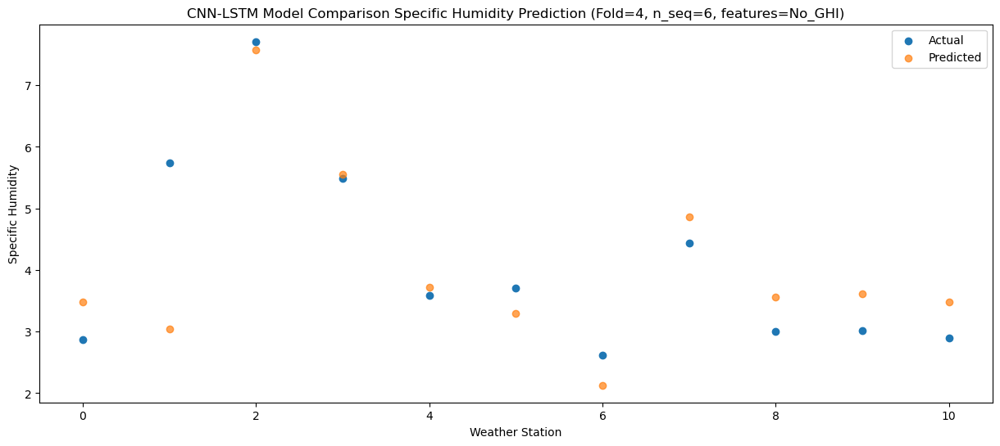

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.63     5.0534
1                 1    5.71     4.6134
2                 2   10.77     9.1534
3                 3    8.15     7.1334
4                 4    6.17     5.2934
5                 5    5.20     4.8634
6                 6    4.33     3.7034
7                 7    6.81     6.4334
8                 8    4.94     5.1334
9                 9    5.39     5.1934
10               10    4.18     5.0534


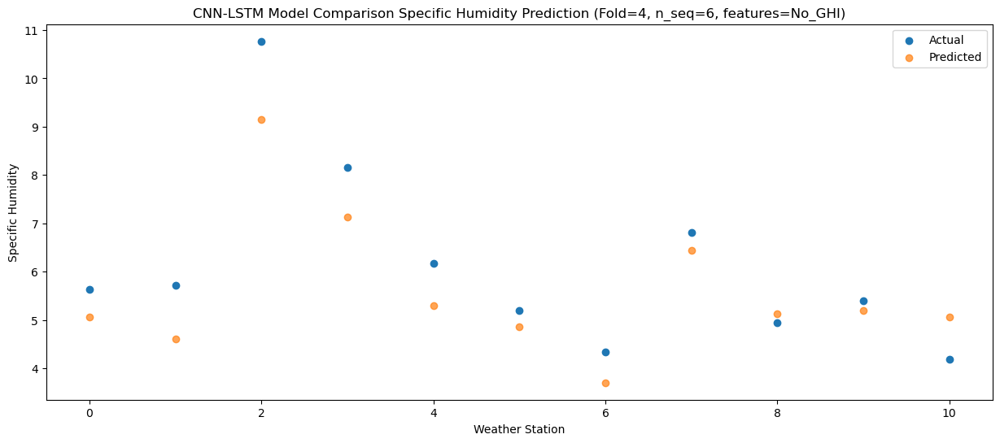

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.84   5.853869
1                 1    6.46   5.413869
2                 2   11.02   9.953869
3                 3    9.44   7.933869
4                 4    7.53   6.093869
5                 5    6.16   5.663869
6                 6    4.74   4.503868
7                 7    7.73   7.233869
8                 8    6.27   5.933868
9                 9    6.70   5.993868
10               10    5.85   5.853868


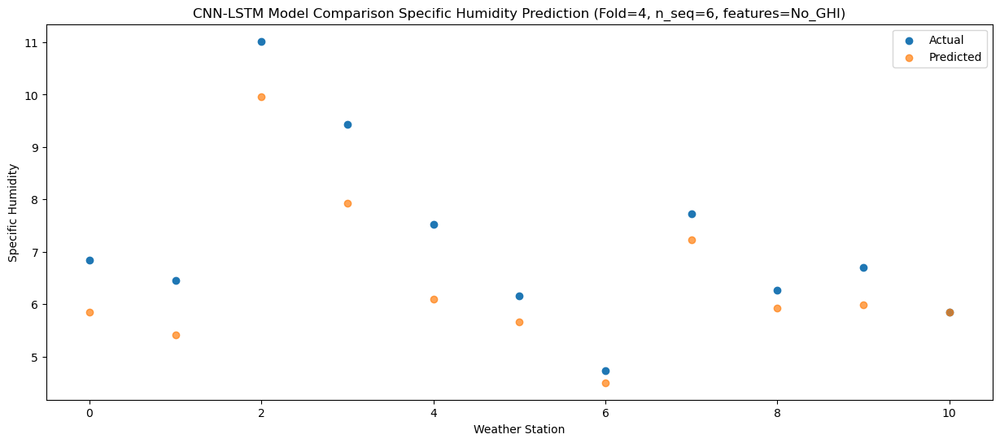

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.40   8.199383
1                 1    7.79   7.759383
2                 2   14.46  12.299383
3                 3   13.44  10.279383
4                 4   11.82   8.439383
5                 5   10.71   8.009382
6                 6    7.72   6.849383
7                 7   10.89   9.579383
8                 8    8.56   8.279383
9                 9    9.32   8.339383
10               10    7.45   8.199383


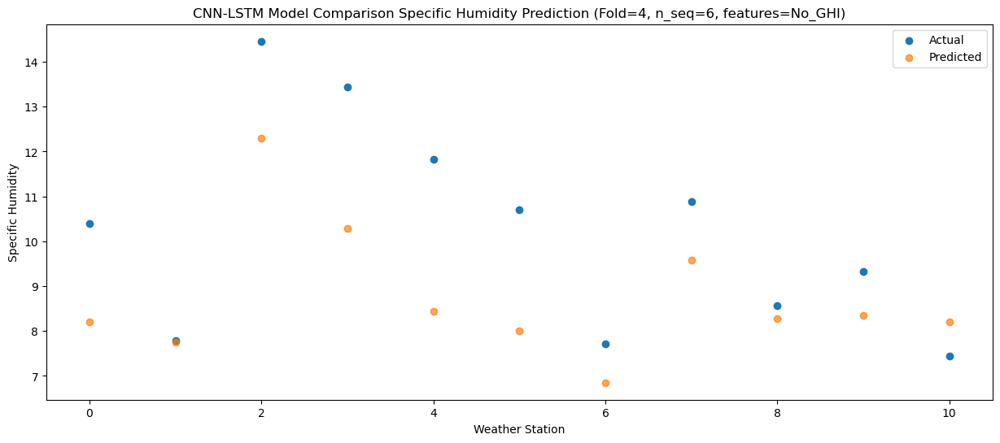

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.99  12.143336
1                 1   12.08  11.703336
2                 2   18.70  16.243336
3                 3   17.13  14.223334
4                 4   15.70  12.383334
5                 5   13.01  11.953333
6                 6   12.41  10.793335
7                 7   15.49  13.523336
8                 8   13.62  12.223335
9                 9   14.07  12.283335
10               10   12.46  12.143335


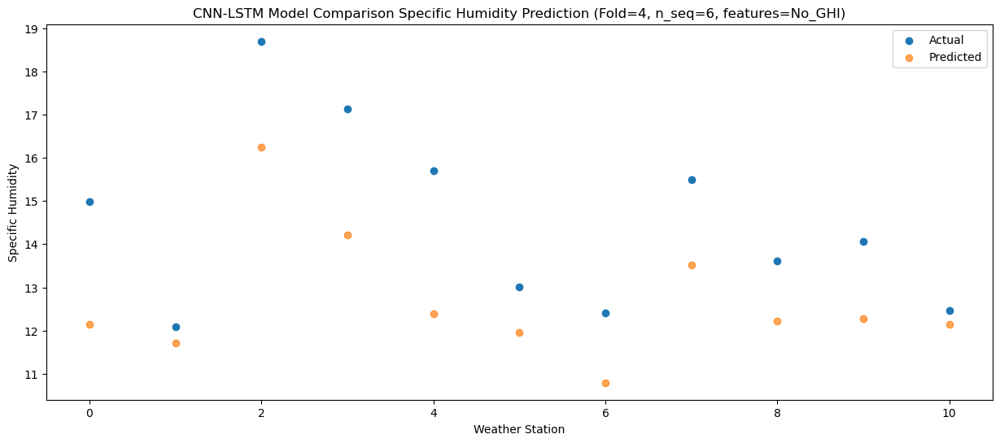

f, t:
[[ 3.96  3.75  7.83  5.81  4.04  4.35  2.37  5.07  3.57  3.66  3.46]
 [ 2.87  5.74  7.71  5.49  3.59  3.71  2.62  4.44  3.    3.02  2.89]
 [ 5.63  5.71 10.77  8.15  6.17  5.2   4.33  6.81  4.94  5.39  4.18]
 [ 6.84  6.46 11.02  9.44  7.53  6.16  4.74  7.73  6.27  6.7   5.85]
 [10.4   7.79 14.46 13.44 11.82 10.71  7.72 10.89  8.56  9.32  7.45]
 [14.99 12.08 18.7  17.13 15.7  13.01 12.41 15.49 13.62 14.07 12.46]]
[[ 3.69831286  3.25831286  7.79831286  5.77831286  3.93831286  3.50831286
   2.34831334  5.07831286  3.77831334  3.83831334  3.69831334]
 [ 3.47962691  3.03962691  7.57962691  5.55962691  3.71962691  3.28962691
   2.12962738  4.85962691  3.55962738  3.61962738  3.47962738]
 [ 5.05340041  4.61340041  9.15340041  7.13340041  5.29340041  4.86340041
   3.70339993  6.43340041  5.13339993  5.19339993  5.05339993]
 [ 5.85386879  5.41386879  9.95386879  7.93386879  6.09386879  5.66386879
   4.50386832  7.23386879  5.93386832  5.99386832  5.85386832]
 [ 8.19938333  7.75938333 12.29

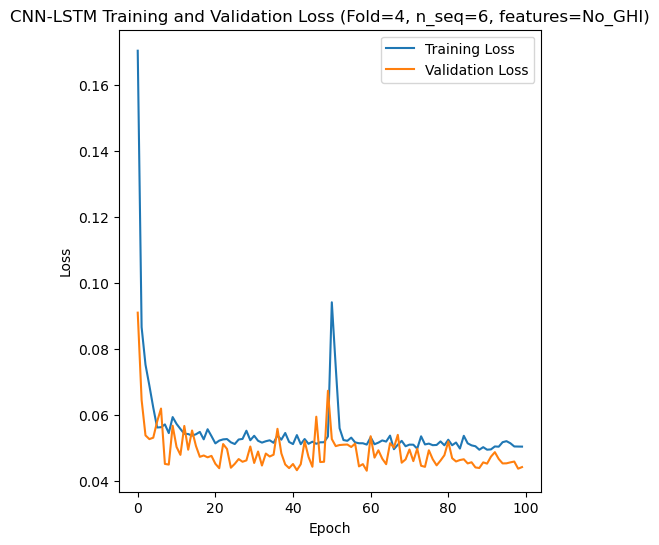

[[2.0052615009290706], [2.290619558502134], [1.6178136306195274], [2.078845181832253], [1.322772788046383]]
[[array(2.0052615)], [array(2.29061956)], [array(1.61781363)], [array(2.07884518)], [array(1.32277279)]]
[[1.641117896130591], [1.7672862905986386], [1.1256927532409173], [1.260849815354203], [0.9561241112875215]]
[[0.1712475218145385], [0.1989308172487398], [0.14576312870362948], [0.26508457702654087], [0.11590251332210193]]
[[0.7522096394090726], [0.6917763880288228], [0.8276556288762382], [0.6238542005986007], [0.8942342823506112]]
[[array(0.17124752)], [array(0.19893082)], [array(0.14576313)], [array(0.26508458)], [array(0.11590251)]]
[[array(0.95642684)], [array(0.94722484)], [array(0.83341339)], [array(0.75467193)], [array(0.95874063)]]
[ 3.9   3.41  6.58  6.97 10.12 14.93  5.74  6.45  8.66  8.88 11.37 16.12
  8.41  8.56 10.41 10.65 13.41 18.03  5.55  5.46  8.91  9.48 12.99 16.89
  7.36  6.96  9.8  11.2  15.21 18.9   4.02  4.61  6.18  7.19  9.69 14.95
  6.35  6.4   7.99  8.

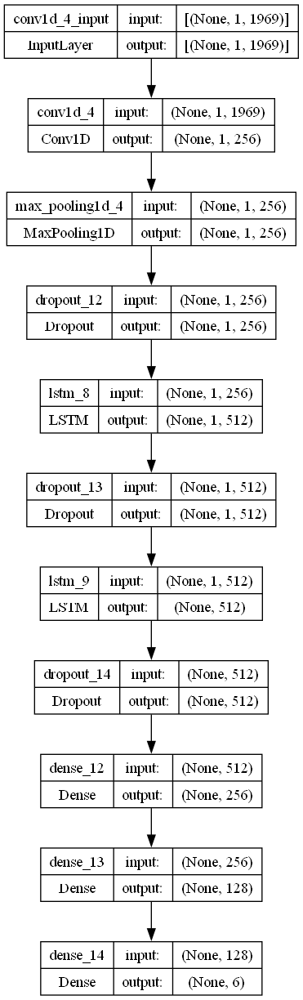

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best CNN-LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 256
    lr = 0.0020345003959972323
    optimizer = Adam(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 512
    dropout_rate = 0.15636332389376578

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (specific_humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_GHI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_GHI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))
print("")
print("Average Specific Humidity:"+str(np.mean(actual_avg_list)))
print("RMSE % of Specific Humidity:"+str(np.mean(rmse2_avg_list)/np.mean(actual_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S6_No_GHI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)